In [ ]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
import torch
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
import torchvision

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Using device: {DEVICE}')

Using device: cuda


In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
!mkdir -p ~/.kaggle
!cp "/content/drive/MyDrive/APS360 Project/Data/kaggle.json" ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json
!kaggle datasets download -d kmader/skin-cancer-mnist-ham10000
!unzip -q skin-cancer-mnist-ham10000.zip -d skin_cancer_data
!ls skin_cancer_data

Dataset URL: https://www.kaggle.com/datasets/kmader/skin-cancer-mnist-ham10000
License(s): CC-BY-NC-SA-4.0
100% 5.20G/5.20G [01:14<00:00, 28.4MB/s]
100% 5.20G/5.20G [01:14<00:00, 75.4MB/s]
ham10000_images_part_1	HAM10000_images_part_2	hmnist_28_28_RGB.csv
HAM10000_images_part_1	HAM10000_metadata.csv	hmnist_8_8_L.csv
ham10000_images_part_2	hmnist_28_28_L.csv	hmnist_8_8_RGB.csv


In [ ]:
data_path = "skin_cancer_data/HAM10000_metadata.csv"
df = pd.read_csv(data_path)
df.head()

,lesion_id,image_id,dx,dx_type,age,sex,localization
0,HAM_0000118,ISIC_0027419,bkl,histo,80.0,male,scalp
1,HAM_0000118,ISIC_0025030,bkl,histo,80.0,male,scalp
2,HAM_0002730,ISIC_0026769,bkl,histo,80.0,male,scalp
3,HAM_0002730,ISIC_0025661,bkl,histo,80.0,male,scalp
4,HAM_0001466,ISIC_0031633,bkl,histo,75.0,male,ear


In [ ]:
df.isnull().sum()
print("Diagnosis classes:", df['dx'].unique())
print("Class distribution:\n", df['dx'].value_counts())

Diagnosis classes: ['bkl' 'nv' 'df' 'mel' 'vasc' 'bcc' 'akiec']
Class distribution:
 dx
nv       6705
mel      1113
bkl      1099
bcc       514
akiec     327
vasc      142
df        115
Name: count, dtype: int64


In [ ]:
import os

image_dir_1 = "skin_cancer_data/ham10000_images_part_1"
image_dir_2 = "skin_cancer_data/ham10000_images_part_2"

all_image_paths = {
    os.path.splitext(fname)[0]: os.path.join(image_dir_1, fname)
    for fname in os.listdir(image_dir_1)
}
all_image_paths.update({
    os.path.splitext(fname)[0]: os.path.join(image_dir_2, fname)
    for fname in os.listdir(image_dir_2)
})

df['image_path'] = df['image_id'].map(all_image_paths)
missing_paths = df[df['image_path'].isnull()]
print("Missing image files:", len(missing_paths))


Missing image files: 0


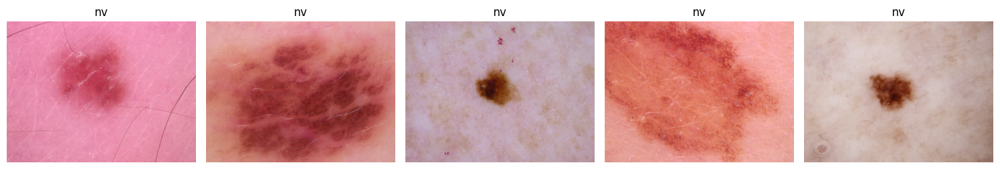

In [ ]:
import matplotlib.image as mpimg

sample_df = df.sample(5)

fig, axes = plt.subplots(1, 5, figsize=(15, 5))
for ax, (_, row) in zip(axes, sample_df.iterrows()):
    img = mpimg.imread(row['image_path'])
    ax.imshow(img)
    ax.set_title(row['dx'])
    ax.axis('off')
plt.tight_layout()
plt.show()

In [ ]:
from sklearn.preprocessing import LabelEncoder


label_encoder = LabelEncoder()
df['label'] = label_encoder.fit_transform(df['dx'])
print("Label classes:", label_encoder.classes_)
label_map = dict(zip(label_encoder.transform(label_encoder.classes_),
                     label_encoder.classes_))
print("Label map:", label_map)

Label classes: ['akiec' 'bcc' 'bkl' 'df' 'mel' 'nv' 'vasc']
Label map: {np.int64(0): 'akiec', np.int64(1): 'bcc', np.int64(2): 'bkl', np.int64(3): 'df', np.int64(4): 'mel', np.int64(5): 'nv', np.int64(6): 'vasc'}


In [ ]:
from sklearn.model_selection import train_test_split

train_df, temp_df = train_test_split(df,
                                     test_size=0.30,
                                     stratify=df['label'],
                                     random_state=42)

val_df, test_df = train_test_split(temp_df,
                                   test_size=0.50,
                                   stratify=temp_df['label'],
                                   random_state=42)

print(f"Train: {len(train_df)} | Val: {len(val_df)} | Test: {len(test_df)}")

Train: 7010 | Val: 1502 | Test: 1503


In [ ]:
import torchvision.transforms as transforms

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

In [ ]:
train_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(degrees=20),
    transforms.ColorJitter(
        brightness=0.2,
        contrast=0.2,
        saturation=0.2
    ),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

val_test_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

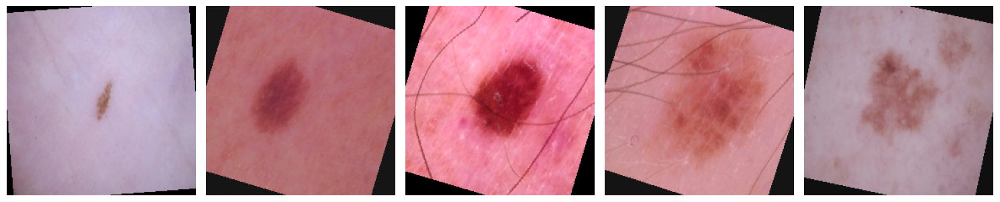

In [ ]:
import random
import matplotlib.pyplot as plt
from PIL import Image

sample_paths = random.sample(list(train_df['image_path']), 5)

plt.figure(figsize=(15,5))

for i, img_path in enumerate(sample_paths):

    img = Image.open(img_path).convert('RGB')


    img_transformed = train_transform(img)


    mean = torch.tensor([0.485, 0.456, 0.406]).view(3,1,1)
    std = torch.tensor([0.229, 0.224, 0.225]).view(3,1,1)
    img_display = img_transformed * std + mean
    img_display = img_display.permute(1, 2, 0).numpy()

    plt.subplot(1, 5, i+1)
    plt.imshow(img_display)
    plt.axis('off')

plt.tight_layout()
plt.show()

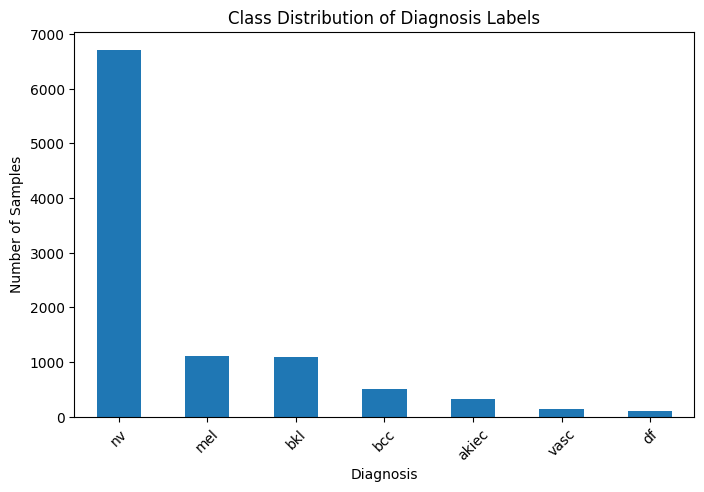

In [ ]:
plt.figure(figsize=(8,5))
df['dx'].value_counts().plot(kind='bar')
plt.title('Class Distribution of Diagnosis Labels')
plt.xlabel('Diagnosis')
plt.ylabel('Number of Samples')
plt.xticks(rotation=45)
plt.show()

In [ ]:
train_dir = "/content/drive/MyDrive/APS360 Project/Data/train"
val_dir = "/content/drive/MyDrive/APS360 Project/Data/val"
test_dir = "/content/drive/MyDrive/APS360 Project/Data/test"

In [ ]:
import shutil

from tqdm import tqdm

train_dir = "/content/drive/MyDrive/APS360 Project/Data/train"
val_dir = "/content/drive/MyDrive/APS360 Project/Data/val"
test_dir = "/content/drive/MyDrive/APS360 Project/Data/test"

idx_class = dict(enumerate(label_encoder.classes_))

def create_class_folders(df, base_dir):
    for idx, row in tqdm(df.iterrows(), total=len(df)):
        img_path = row['image_path']
        dx = row['dx']
        label = row['label']
        class_folder = os.path.join(base_dir, idx_class[label])
        if not os.path.exists(class_folder):
            os.makedirs(class_folder)
            shutil.copy(img_path, class_folder)
        else:
            shutil.copy(img_path, class_folder)
            print(f"Image {img_path} copied to class folder {class_folder}")


create_class_folders(train_df, train_dir)
create_class_folders(val_df, val_dir)
create_class_folders(test_df, test_dir)

augmented_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(degrees=180),
    transforms.ColorJitter(
        brightness=0.2,
        contrast=0.2,
        saturation=0.2
    ),
    transforms.ToTensor(),
])

def augment_images(class_dir, target_num=6000):
    existing_images = os.listdir(class_dir)
    current_count = len(existing_images)

    if current_count >= target_num:
        print(
f"{os.path.basename(class_dir)} already has {current_count} images, skipping augmentation.")
        return

    print(
f"Augmenting {os.path.basename(class_dir)} from {current_count} to {target_num} images.")

    image_paths = [os.path.join(class_dir, fname) for fname in existing_images]

    for i in tqdm(range(target_num - current_count)):
        img_path = random.choice(image_paths)
        img = Image.open(img_path).convert('RGB')
        img_t = augmented_transforms(img)

        save_path = os.path.join(class_dir,
                                 f"augmented_{i}_{os.path.basename(img_path)}")


        torchvision.utils.save_image(img_t, save_path)

for label in train_df['label'].unique():
    class_folder = os.path.join(train_dir, idx_class[label])
    augment_images(class_folder, target_num=6000)


  0%|          | 16/7010 [00:00<01:27, 80.38it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0033895.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025491.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031023.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028660.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031295.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030884.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031398.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_

  1%|          | 38/7010 [00:00<01:15, 92.74it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0026575.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030961.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028398.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032348.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030768.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030798.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027800.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10

  1%|          | 58/7010 [00:00<01:22, 84.35it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0034186.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029459.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030519.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032715.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/vasc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034200.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032519.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025252.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000

  1%|          | 79/7010 [00:00<01:16, 90.03it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0030155.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032482.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029807.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032501.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028766.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025079.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026896.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_i

  1%|▏         | 101/7010 [00:01<01:11, 97.17it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0030882.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/vasc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024354.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024326.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027369.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024813.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026461.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028212.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_

  2%|▏         | 121/7010 [00:01<01:11, 96.53it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0027513.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029500.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031906.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030242.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024382.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030194.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028315.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham

  2%|▏         | 142/7010 [00:01<01:10, 97.95it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0027409.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033002.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032890.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/vasc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031091.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027753.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033535.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032576.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10

  2%|▏         | 162/7010 [00:01<01:10, 96.86it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0033417.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032835.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029557.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026143.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031774.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034304.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027695.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_

  2%|▏         | 174/7010 [00:01<01:09, 98.78it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0025634.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033123.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/vasc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026118.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029770.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031182.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026978.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031082.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham100

  3%|▎         | 196/7010 [00:02<01:07, 100.38it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0030076.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025073.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024937.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025112.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029930.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030911.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025083.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham1

  3%|▎         | 218/7010 [00:02<01:08, 99.68it/s] 

Image skin_cancer_data/ham10000_images_part_2/ISIC_0030295.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031753.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031691.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026258.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024579.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032082.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026875.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10

  3%|▎         | 240/7010 [00:02<01:06, 101.61it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0027252.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033992.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026244.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028713.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030072.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033091.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031974.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_im

  4%|▎         | 252/7010 [00:02<01:05, 103.17it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0024766.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026982.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025303.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032231.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031434.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029800.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033662.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_

  4%|▍         | 274/7010 [00:03<01:36, 69.60it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0031622.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031764.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026794.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026562.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030341.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025398.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033598.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham1000

  4%|▍         | 295/7010 [00:03<01:22, 81.11it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0025411.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028845.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027727.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/df
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026284.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031836.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029047.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028537.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham100

  5%|▍         | 318/7010 [00:03<01:12, 92.69it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0028435.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033064.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031523.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026957.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032052.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031334.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025759.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_

  5%|▍         | 340/7010 [00:03<01:08, 97.65it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0033236.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029059.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030213.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024529.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028366.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025649.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028474.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000

  5%|▌         | 363/7010 [00:03<01:04, 102.87it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0028295.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026782.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030329.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033888.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025200.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024475.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/vasc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025627.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham1000

  5%|▌         | 385/7010 [00:04<01:03, 103.79it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0025591.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031981.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024859.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029592.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026661.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025580.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027631.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_

  6%|▌         | 407/7010 [00:04<01:05, 100.46it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0034285.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032409.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/vasc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026144.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031261.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025286.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029528.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028720.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham1000

  6%|▌         | 430/7010 [00:04<01:03, 103.61it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0026737.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029640.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024770.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032065.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026004.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025818.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032586.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham1000

  6%|▋         | 451/7010 [00:04<01:09, 94.39it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0034033.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029806.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032099.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029876.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026709.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028635.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030946.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham1000

  7%|▋         | 472/7010 [00:05<01:10, 92.71it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0027735.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025611.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029371.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030024.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033577.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031264.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033637.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham100

  7%|▋         | 493/7010 [00:05<01:08, 95.55it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0027651.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031167.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026201.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029357.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026916.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029294.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027875.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000

  7%|▋         | 503/7010 [00:05<01:18, 82.73it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0031865.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033917.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025521.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032528.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030649.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026966.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024784.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_i

  7%|▋         | 522/7010 [00:05<01:21, 79.39it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0025291.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024416.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024979.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030545.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034016.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033979.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030302.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_i

  8%|▊         | 542/7010 [00:05<01:15, 85.78it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0033198.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032250.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025683.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028956.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025783.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031195.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025108.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_

  8%|▊         | 564/7010 [00:06<01:08, 93.79it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0030691.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024560.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028467.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029297.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/df
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027445.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031898.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027193.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_i

  8%|▊         | 584/7010 [00:06<01:07, 95.65it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0034087.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028663.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028487.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033665.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029440.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029494.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028043.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_

  9%|▊         | 606/7010 [00:06<01:04, 99.10it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0026322.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028045.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031447.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025030.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030964.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026697.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034301.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000

  9%|▉         | 627/7010 [00:07<01:38, 64.72it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0030685.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026307.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033147.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031697.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030362.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024762.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025715.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_i

  9%|▉         | 649/7010 [00:07<01:21, 78.25it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0026017.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026346.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030059.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033774.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028330.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026121.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028705.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_im

 10%|▉         | 671/7010 [00:07<01:14, 85.29it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0024846.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026981.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032500.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030231.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027318.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026855.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031902.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham100

 10%|▉         | 693/7010 [00:07<01:07, 93.70it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0027669.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024464.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032605.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031115.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029084.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025844.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033860.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/df
Image skin_cancer_data/ham10000_i

 10%|█         | 715/7010 [00:07<01:04, 98.20it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0027506.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025246.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025703.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025236.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033206.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030817.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033533.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10

 11%|█         | 737/7010 [00:08<01:04, 97.21it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0024512.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026809.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029237.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024678.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031254.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026576.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029970.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_i

 11%|█         | 759/7010 [00:08<01:03, 99.08it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0026282.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031794.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032689.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027847.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027853.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028883.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030541.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_i

 11%|█         | 781/7010 [00:08<01:02, 100.30it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0025921.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033404.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032592.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031478.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029217.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028938.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032946.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_

 11%|█▏        | 803/7010 [00:08<01:01, 100.29it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0031876.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026002.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025044.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031539.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026164.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031706.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/vasc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026362.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham1

 12%|█▏        | 814/7010 [00:08<01:03, 97.34it/s] 

Image skin_cancer_data/ham10000_images_part_2/ISIC_0031964.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028078.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028759.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028964.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027886.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030454.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025633.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_i

 12%|█▏        | 834/7010 [00:09<01:27, 70.91it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0029844.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026987.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025849.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030588.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030174.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028488.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029453.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_i

 12%|█▏        | 855/7010 [00:09<01:14, 82.88it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0032836.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025183.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029140.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030102.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029648.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032449.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024377.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_i

 12%|█▏        | 866/7010 [00:09<01:10, 87.54it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0026421.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029542.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030559.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027200.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032092.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030693.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029913.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_

 13%|█▎        | 886/7010 [00:10<01:58, 51.55it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0033599.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026093.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028895.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025478.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027055.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032128.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025885.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_

 13%|█▎        | 906/7010 [00:10<01:31, 66.43it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0024954.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032331.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028835.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028248.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027856.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/vasc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025150.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029943.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000

 13%|█▎        | 928/7010 [00:10<01:14, 81.43it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0030585.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024983.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026507.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025375.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034241.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029563.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033954.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000

 14%|█▎        | 948/7010 [00:10<01:07, 89.49it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0025740.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031399.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029701.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025319.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026729.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025794.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026449.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10

 14%|█▍        | 968/7010 [00:11<01:12, 83.06it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0026505.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024944.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033378.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028692.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027938.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033864.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031287.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_

 14%|█▍        | 986/7010 [00:11<01:12, 83.26it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0028608.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029122.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028685.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034026.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031419.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027676.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031819.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000

 14%|█▍        | 1007/7010 [00:11<01:05, 92.00it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0034028.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030480.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026644.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024441.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027620.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026636.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031575.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000

 15%|█▍        | 1029/7010 [00:11<01:02, 96.06it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0029044.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025106.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026676.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031969.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032207.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025525.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031372.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/df
Image skin_cancer_data/ham10000_i

 15%|█▍        | 1050/7010 [00:12<01:01, 97.39it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0033984.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025792.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027684.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030696.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033944.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032808.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024325.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_i

 15%|█▌        | 1070/7010 [00:12<01:05, 91.02it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0028991.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027226.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025645.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030654.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031180.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033491.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031894.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_i

 15%|█▌        | 1080/7010 [00:12<01:10, 84.60it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0026771.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028468.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032852.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025313.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029412.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031314.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030590.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_

 16%|█▌        | 1100/7010 [00:12<01:07, 88.17it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0031333.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025120.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031356.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032882.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024341.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030601.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030664.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_im

 16%|█▌        | 1120/7010 [00:12<01:04, 91.55it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0028939.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030931.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032354.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033798.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024838.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030284.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026126.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_im

 16%|█▋        | 1140/7010 [00:13<01:02, 93.65it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0031967.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029024.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027082.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033520.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025072.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027052.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024905.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_

 17%|█▋        | 1160/7010 [00:13<01:12, 80.90it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0029793.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025376.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028614.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031330.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025320.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034083.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030440.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000

 17%|█▋        | 1170/7010 [00:13<01:09, 84.43it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0029561.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032813.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032221.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030145.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031946.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031321.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028047.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_

 17%|█▋        | 1189/7010 [00:13<01:12, 80.78it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0029331.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033671.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031548.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033928.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025724.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024544.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024555.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_

 17%|█▋        | 1207/7010 [00:13<01:11, 81.06it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0028513.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025899.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028897.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024677.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031620.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031986.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030722.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/vasc
Image skin_cancer_data/ham100

 17%|█▋        | 1225/7010 [00:14<01:11, 80.88it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0031211.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030648.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031682.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032790.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032206.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033415.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032253.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham

 18%|█▊        | 1234/7010 [00:14<01:12, 79.49it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0028272.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033216.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024413.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029177.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/df
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026960.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032097.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028824.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_i

 18%|█▊        | 1254/7010 [00:14<01:34, 60.72it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0032390.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025572.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028718.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029469.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033032.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025424.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027217.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_i

 18%|█▊        | 1276/7010 [00:14<01:15, 76.06it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0028594.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031730.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026249.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033347.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028662.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031459.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028990.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10

 18%|█▊        | 1295/7010 [00:15<01:09, 82.67it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0026858.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027765.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034174.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029835.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028930.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024637.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032582.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_i

 19%|█▊        | 1314/7010 [00:15<01:06, 86.14it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0028630.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031554.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033748.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032759.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026247.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032652.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025755.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham1000

 19%|█▉        | 1335/7010 [00:15<00:59, 95.17it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0025994.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025290.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032973.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033503.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028675.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025777.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029390.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_i

 19%|█▉        | 1355/7010 [00:15<01:02, 91.01it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0028319.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024435.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031891.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024312.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034202.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026767.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029224.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000

 20%|█▉        | 1376/7010 [00:15<00:59, 94.11it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0031020.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034096.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028296.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031486.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033739.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026100.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024817.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000

 20%|█▉        | 1399/7010 [00:16<00:57, 97.64it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0032448.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028307.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026248.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032878.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027634.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026188.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030764.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_

 20%|██        | 1419/7010 [00:16<01:02, 89.40it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0029219.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028270.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024702.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033875.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026923.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029785.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031401.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000

 21%|██        | 1440/7010 [00:16<00:58, 94.70it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0027778.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032921.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033793.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034075.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029774.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024433.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028349.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_i

 21%|██        | 1460/7010 [00:16<00:59, 92.69it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0032008.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025171.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031198.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031711.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026726.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032804.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032242.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham100

 21%|██        | 1479/7010 [00:17<01:24, 65.66it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0033902.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026710.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026056.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027042.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034126.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027741.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025717.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham1000

 21%|██▏       | 1499/7010 [00:17<01:11, 76.98it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0024598.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025268.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032533.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025088.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027531.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032970.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031802.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham1000

 22%|██▏       | 1520/7010 [00:17<01:09, 79.30it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0030674.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028975.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028687.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026885.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027627.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028993.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026986.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_i

 22%|██▏       | 1531/7010 [00:17<01:05, 83.74it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0029462.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025438.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032939.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033181.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029651.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029752.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029038.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham1000

 22%|██▏       | 1554/7010 [00:18<00:57, 95.12it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0025240.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027962.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025716.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033510.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028053.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030245.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029343.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham100

 22%|██▏       | 1577/7010 [00:18<00:54, 98.81it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0033304.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026179.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027701.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027094.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025000.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026527.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025471.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham100

 23%|██▎       | 1599/7010 [00:18<00:53, 100.85it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0033242.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026940.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024548.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025556.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033838.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031864.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031843.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_i

 23%|██▎       | 1621/7010 [00:18<00:55, 96.68it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0028187.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033691.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026569.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027288.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033919.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033256.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/df
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028891.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_i

 23%|██▎       | 1641/7010 [00:18<00:55, 96.91it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0024397.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033664.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025626.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030195.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028402.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027789.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027922.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_im

 24%|██▎       | 1661/7010 [00:19<00:56, 94.28it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0034001.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033288.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028111.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030945.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026356.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027636.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030364.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_im

 24%|██▍       | 1681/7010 [00:19<00:59, 89.88it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0028335.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030745.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028844.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034194.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026137.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028491.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029374.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000

 24%|██▍       | 1691/7010 [00:19<02:04, 42.74it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0030636.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030093.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032360.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033826.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv


 24%|██▍       | 1700/7010 [00:20<01:46, 49.81it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0033463.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033251.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027981.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027296.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024513.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032244.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028106.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_

 25%|██▍       | 1721/7010 [00:20<01:21, 64.91it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0027738.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031718.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030185.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026037.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025048.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027872.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030778.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000

 25%|██▍       | 1742/7010 [00:20<01:08, 76.54it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0027087.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029196.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029378.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027639.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027330.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026927.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027895.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000

 25%|██▌       | 1764/7010 [00:20<00:59, 88.58it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0024843.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024482.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033221.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027033.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025314.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/df
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029483.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030167.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham100

 25%|██▌       | 1786/7010 [00:20<00:55, 94.38it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0027412.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034035.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029881.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027485.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030834.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024690.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031061.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_i

 26%|██▌       | 1808/7010 [00:21<00:52, 98.45it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0024462.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033922.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026239.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033749.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/vasc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034111.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030726.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024943.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham1000

 26%|██▌       | 1829/7010 [00:21<00:53, 97.60it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0028810.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028980.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031821.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026999.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024816.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025345.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027900.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham1000

 26%|██▌       | 1839/7010 [00:21<00:54, 94.64it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0026808.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034047.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028542.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028280.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027009.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027941.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031842.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_

 27%|██▋       | 1859/7010 [00:21<00:57, 89.15it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0032842.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026899.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028593.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029578.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/df
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027820.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027455.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024593.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham1000

 27%|██▋       | 1879/7010 [00:21<00:55, 91.91it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0026319.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027167.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033001.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033606.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032765.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031557.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028352.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham

 27%|██▋       | 1899/7010 [00:22<00:55, 92.43it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0025950.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030689.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025144.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028049.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024767.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029611.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032208.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000

 27%|██▋       | 1919/7010 [00:22<00:54, 93.64it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0025211.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026625.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029492.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027359.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031326.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033851.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024588.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham100

 28%|██▊       | 1941/7010 [00:22<00:52, 96.20it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0031446.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029454.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032964.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034233.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027750.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028121.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027362.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000

 28%|██▊       | 1963/7010 [00:22<00:52, 97.02it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0033924.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027921.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027868.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028046.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027103.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033879.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025733.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_i

 28%|██▊       | 1985/7010 [00:23<00:50, 98.90it/s] 

Image skin_cancer_data/ham10000_images_part_1/ISIC_0025176.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027540.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029503.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028871.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024567.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033103.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025690.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_

 29%|██▊       | 2005/7010 [00:23<00:51, 97.63it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0026342.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033495.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030941.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031461.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030786.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032119.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029388.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_im

 29%|██▉       | 2025/7010 [00:23<00:52, 94.92it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0031390.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032513.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027434.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030380.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025158.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032270.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/vasc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029959.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000

 29%|██▉       | 2045/7010 [00:23<00:54, 90.71it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0029944.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033366.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027010.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030926.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033568.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025960.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027552.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham1000

 29%|██▉       | 2055/7010 [00:23<00:59, 82.79it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0029531.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033481.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026581.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034162.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026387.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028951.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028886.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_i

 30%|██▉       | 2074/7010 [00:24<01:20, 61.12it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0033518.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029664.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029498.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030177.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033548.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025102.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028967.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000

 30%|██▉       | 2093/7010 [00:24<01:07, 72.78it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0029712.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033704.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027387.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030936.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029477.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028677.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029310.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000

 30%|███       | 2111/7010 [00:24<01:07, 72.89it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0028525.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031962.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028458.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031441.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031048.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029632.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034157.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_

 30%|███       | 2131/7010 [00:24<00:59, 82.60it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0032251.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032906.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032543.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029441.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024967.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033201.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031830.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000

 31%|███       | 2143/7010 [00:25<00:54, 89.94it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0031601.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033857.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025810.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031498.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028578.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025979.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032034.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000

 31%|███       | 2166/7010 [00:25<00:50, 96.59it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0034058.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028167.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033927.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028564.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026361.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027331.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025259.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_i

 31%|███       | 2177/7010 [00:25<00:51, 93.16it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0034106.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033100.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029510.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025919.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026671.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026099.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027332.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_

 31%|███▏      | 2196/7010 [00:25<01:04, 75.00it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0030909.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030172.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031139.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028110.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030506.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034217.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033812.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_

 32%|███▏      | 2214/7010 [00:25<01:00, 79.56it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0026725.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031769.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026022.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026891.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029525.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025133.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032176.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_i

 32%|███▏      | 2233/7010 [00:26<00:58, 82.02it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0028466.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033946.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025278.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029136.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034114.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025363.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029241.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000

 32%|███▏      | 2254/7010 [00:26<00:53, 89.53it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0032430.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028604.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029057.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028062.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029269.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033663.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025561.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_

 32%|███▏      | 2264/7010 [00:26<00:52, 89.65it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0027239.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025334.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026207.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033176.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025379.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029627.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030624.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000

 33%|███▎      | 2282/7010 [00:26<01:18, 59.98it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0029046.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025631.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027317.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025167.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027590.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031849.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030774.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_i

 33%|███▎      | 2300/7010 [00:27<01:08, 68.74it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0033873.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027005.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027834.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024380.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029954.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031826.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026883.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_im

 33%|███▎      | 2308/7010 [00:27<01:10, 66.46it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0029851.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028298.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033633.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033182.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025700.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032436.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032017.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham100

 33%|███▎      | 2325/7010 [00:27<01:03, 73.71it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0028926.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/df
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027520.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028014.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027062.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033297.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026584.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033782.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_im

 33%|███▎      | 2347/7010 [00:27<00:52, 88.15it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0033254.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/vasc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027175.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028449.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026930.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027344.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029281.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028383.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham1

 34%|███▍      | 2368/7010 [00:27<00:49, 93.93it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0024369.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032677.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030522.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029837.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031535.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025335.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029652.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000

 34%|███▍      | 2388/7010 [00:28<00:50, 92.33it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0029689.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033253.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026679.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026711.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031619.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026235.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033871.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000

 34%|███▍      | 2408/7010 [00:28<00:52, 87.37it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0027493.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029381.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028636.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027063.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028561.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030163.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029181.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_i

 35%|███▍      | 2429/7010 [00:28<00:49, 92.77it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0033345.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024383.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024910.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024945.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030143.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027218.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034131.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10

 35%|███▍      | 2449/7010 [00:28<00:49, 91.24it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0029481.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028469.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024725.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033586.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028902.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030037.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030670.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_i

 35%|███▌      | 2470/7010 [00:29<00:52, 86.22it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0030782.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024921.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032213.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029956.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025071.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029285.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026599.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_i

 35%|███▌      | 2481/7010 [00:29<00:50, 88.92it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0031243.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030450.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026943.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029730.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031665.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026853.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025198.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_

 36%|███▌      | 2492/7010 [00:29<00:48, 93.83it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0029188.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv


 36%|███▌      | 2511/7010 [00:29<01:25, 52.57it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0025836.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033398.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024340.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028707.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033546.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025831.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030323.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10

 36%|███▌      | 2530/7010 [00:30<01:06, 67.04it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0031592.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025657.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026668.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028534.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033856.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034044.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026310.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_

 36%|███▋      | 2551/7010 [00:30<00:56, 79.25it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0029615.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034243.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025840.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028086.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028727.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032773.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027188.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/df
Image skin_cancer_data/ham10000

 37%|███▋      | 2570/7010 [00:30<00:53, 82.77it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0032600.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032848.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027092.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027934.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024861.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030842.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031600.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_i

 37%|███▋      | 2590/7010 [00:30<00:49, 89.43it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0025089.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025343.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032291.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025328.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026495.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030491.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033523.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham1

 37%|███▋      | 2611/7010 [00:30<00:48, 91.54it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0025182.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032157.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025913.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030007.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026626.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026071.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032602.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham

 37%|███▋      | 2621/7010 [00:31<00:47, 91.83it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0031365.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027831.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031945.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031056.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024891.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030757.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/df
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032202.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000

 38%|███▊      | 2644/7010 [00:31<00:46, 94.60it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0028032.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026914.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031734.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027546.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031468.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030370.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033709.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000

 38%|███▊      | 2666/7010 [00:31<00:44, 96.60it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0026029.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028558.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032473.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032002.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026221.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027999.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026772.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000

 38%|███▊      | 2686/7010 [00:31<00:45, 94.03it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0032201.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033524.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033484.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026281.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030566.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028556.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028962.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000

 39%|███▊      | 2706/7010 [00:31<00:47, 91.09it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0025896.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029326.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028361.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028765.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032549.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026734.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029984.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_

 39%|███▉      | 2725/7010 [00:32<00:50, 84.28it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0032486.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033742.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024407.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033122.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030431.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029923.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030772.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_

 39%|███▉      | 2736/7010 [00:32<00:48, 87.37it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0034177.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033399.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034214.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/vasc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029780.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031558.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028425.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030296.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham100

 39%|███▉      | 2757/7010 [00:32<00:45, 92.74it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0027323.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027533.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031014.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026820.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029158.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032664.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033056.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_

 40%|███▉      | 2777/7010 [00:32<00:45, 93.01it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0024520.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027308.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029894.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029673.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025900.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031472.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028200.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_i

 40%|███▉      | 2797/7010 [00:32<00:45, 92.68it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0033145.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027483.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030025.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029518.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032371.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030525.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026208.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham1000

 40%|████      | 2818/7010 [00:33<00:43, 95.67it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0029045.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033960.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034316.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033388.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031388.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031938.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024895.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_i

 41%|████      | 2840/7010 [00:33<00:42, 98.23it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0027108.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030002.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028465.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026214.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032475.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027562.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027214.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham100

 41%|████      | 2860/7010 [00:33<00:42, 96.66it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0029144.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027572.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027960.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034061.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029740.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031560.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026512.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000

 41%|████      | 2879/7010 [00:34<01:25, 48.55it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0024373.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032816.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026026.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025925.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028949.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029662.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031659.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham1000

 41%|████▏     | 2899/7010 [00:34<01:03, 64.70it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0030239.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028073.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033619.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026539.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028745.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033163.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028426.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_

 42%|████▏     | 2919/7010 [00:34<00:53, 76.73it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0025057.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029270.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024539.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030044.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025837.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032264.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027248.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham100

 42%|████▏     | 2939/7010 [00:34<00:47, 84.90it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0031863.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027410.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032228.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027912.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025996.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027935.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029169.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_i

 42%|████▏     | 2960/7010 [00:35<00:47, 85.68it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0027079.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030371.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026139.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025726.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025093.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032614.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/vasc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031018.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000

 43%|████▎     | 2980/7010 [00:35<00:44, 90.33it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0031621.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030564.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028044.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032399.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033458.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/vasc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031671.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030618.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000

 43%|████▎     | 2991/7010 [00:35<00:42, 93.89it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0026085.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026312.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027535.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025617.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027503.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029976.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027109.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_

 43%|████▎     | 3010/7010 [00:35<00:48, 83.10it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0024709.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028516.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026969.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025820.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032722.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024920.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029064.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_

 43%|████▎     | 3030/7010 [00:35<00:44, 89.14it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0028817.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030512.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024928.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027679.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026187.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027588.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028126.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham100

 44%|████▎     | 3050/7010 [00:36<00:45, 87.79it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0034152.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029703.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031968.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024925.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029916.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031824.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026228.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham1000

 44%|████▍     | 3072/7010 [00:36<00:41, 94.15it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0032225.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027407.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032770.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032654.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031816.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032667.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025588.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000

 44%|████▍     | 3092/7010 [00:36<00:41, 94.06it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0029354.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024815.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032768.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034136.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024704.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027145.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033451.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_i

 44%|████▍     | 3112/7010 [00:36<00:42, 91.65it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0031353.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029226.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028198.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029887.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030290.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027127.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034080.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_i

 45%|████▍     | 3132/7010 [00:37<00:41, 92.73it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0027075.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029620.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026078.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028457.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025998.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032296.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031652.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_i

 45%|████▍     | 3142/7010 [00:37<00:42, 90.68it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0027714.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029040.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029211.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025855.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029363.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033943.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028584.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000

 45%|████▌     | 3163/7010 [00:37<00:44, 85.81it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0033841.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030275.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/vasc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027767.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028789.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031281.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031484.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026744.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10

 45%|████▌     | 3181/7010 [00:37<00:48, 78.59it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0029636.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033062.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027882.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031678.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029216.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026865.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034227.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_

 46%|████▌     | 3199/7010 [00:37<00:48, 78.43it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0033159.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028357.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031133.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024417.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029968.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028166.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025929.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_i

 46%|████▌     | 3220/7010 [00:38<00:44, 85.72it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0027740.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029396.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026205.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029005.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029656.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028070.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027817.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_

 46%|████▌     | 3238/7010 [00:38<00:43, 85.84it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0028133.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024915.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026541.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027523.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027737.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026720.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029191.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham100

 46%|████▋     | 3259/7010 [00:38<00:42, 88.96it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0026662.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034215.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033819.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033434.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032172.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025435.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026367.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_i

 47%|████▋     | 3268/7010 [00:38<00:54, 69.03it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0031239.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031173.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028156.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024994.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/df
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031742.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028728.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024854.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000

 47%|████▋     | 3276/7010 [00:38<00:54, 69.02it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0027447.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026168.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030827.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026355.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028777.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028960.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027205.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham1

 47%|████▋     | 3292/7010 [00:39<00:56, 66.05it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0030904.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028887.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025548.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029798.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030460.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027530.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024771.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham1000

 47%|████▋     | 3309/7010 [00:39<00:51, 71.91it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0024541.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030852.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027333.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033473.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032640.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025202.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028193.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_i

 47%|████▋     | 3326/7010 [00:39<00:52, 70.31it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0027433.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026081.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024499.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025082.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025801.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025781.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029639.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000

 48%|████▊     | 3334/7010 [00:39<01:03, 57.77it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0030874.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024881.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028682.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026468.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026102.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030403.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030071.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham100

 48%|████▊     | 3352/7010 [00:40<00:53, 68.52it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0033346.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026347.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031232.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029540.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031862.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030365.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026450.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_i

 48%|████▊     | 3369/7010 [00:40<00:50, 72.77it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0031503.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032990.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025651.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029365.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027166.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027456.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025312.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_

 48%|████▊     | 3377/7010 [00:40<00:55, 65.52it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0033113.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032153.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030433.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033112.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026595.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026823.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028158.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham1000

 48%|████▊     | 3393/7010 [00:40<00:52, 68.60it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0031055.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028220.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031294.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032755.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029137.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032395.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029801.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham1000

 49%|████▊     | 3411/7010 [00:40<00:46, 77.38it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0030686.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030765.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026616.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033387.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028478.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024569.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030652.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_i

 49%|████▉     | 3431/7010 [00:41<00:42, 84.54it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0034052.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026832.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029909.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033814.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032055.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033581.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025008.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham1000

 49%|████▉     | 3450/7010 [00:41<00:40, 87.79it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0028648.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030815.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027110.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026477.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029549.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031563.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029223.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham1000

 49%|████▉     | 3468/7010 [00:41<00:41, 86.05it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0025737.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029962.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/df
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028188.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/vasc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033941.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033563.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027549.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030411.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_

 50%|████▉     | 3489/7010 [00:41<00:37, 93.47it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0034287.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029418.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027211.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033852.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030604.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028755.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028249.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000

 50%|█████     | 3509/7010 [00:41<00:38, 92.11it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0027385.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/vasc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029905.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032098.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028500.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033512.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033088.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025745.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham1000

 50%|█████     | 3529/7010 [00:42<00:38, 91.29it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0025882.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033654.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031657.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034225.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033744.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026412.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028263.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_

 51%|█████     | 3549/7010 [00:42<00:38, 90.79it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0028695.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029263.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024800.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032983.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028842.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025003.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031305.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10

 51%|█████     | 3559/7010 [00:42<00:38, 89.88it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0024310.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034293.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024586.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026222.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030263.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024756.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026598.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000

 51%|█████     | 3580/7010 [00:42<00:38, 89.01it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0031768.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033622.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031662.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028275.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033161.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029081.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024688.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_

 51%|█████▏    | 3600/7010 [00:42<00:37, 91.45it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0032169.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026607.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032565.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026399.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031015.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027775.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028042.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_i

 52%|█████▏    | 3620/7010 [00:43<00:36, 92.61it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0025226.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031164.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033151.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024605.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026052.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032619.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032545.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/vasc
Image skin_cancer_data/ham100

 52%|█████▏    | 3643/7010 [00:43<00:36, 92.84it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0027623.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027182.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027878.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029303.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027197.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030488.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028752.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_i

 52%|█████▏    | 3663/7010 [00:43<00:35, 95.48it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0033600.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032497.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028992.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027835.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027352.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033054.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026371.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham1000

 53%|█████▎    | 3683/7010 [00:43<00:35, 93.18it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0024893.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031886.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033571.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031661.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031637.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027949.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030747.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000

 53%|█████▎    | 3693/7010 [00:43<00:35, 94.41it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0025941.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032424.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030748.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030949.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032673.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032279.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030019.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_

 53%|█████▎    | 3713/7010 [00:44<01:08, 48.14it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0030022.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034257.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029187.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033621.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031745.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025440.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024535.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_i

 53%|█████▎    | 3733/7010 [00:44<00:51, 64.23it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0025377.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026635.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033167.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031260.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028109.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028182.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032965.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_

 54%|█████▎    | 3752/7010 [00:45<00:42, 76.22it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0025064.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030287.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032059.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026138.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025565.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027326.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029582.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham

 54%|█████▍    | 3773/7010 [00:45<00:36, 88.06it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0033313.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029588.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026724.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028888.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029127.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024809.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025324.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_

 54%|█████▍    | 3795/7010 [00:45<00:34, 92.87it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0030538.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025519.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031183.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029119.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028288.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027703.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029931.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000

 54%|█████▍    | 3815/7010 [00:45<00:36, 87.90it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0026862.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026533.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026273.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030308.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028681.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032635.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026561.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_

 55%|█████▍    | 3834/7010 [00:45<00:36, 86.35it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0030090.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033321.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033697.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031009.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028838.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028424.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031770.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000

 55%|█████▍    | 3843/7010 [00:46<00:38, 83.31it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0027764.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028384.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028012.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025719.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031029.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026162.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029559.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000

 55%|█████▌    | 3864/7010 [00:46<00:35, 87.67it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0033079.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032441.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027610.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031340.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028483.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029522.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031443.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/df
Image skin_cancer_data/ham10000

 55%|█████▌    | 3882/7010 [00:46<00:35, 88.60it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0031720.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026849.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030800.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026033.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028174.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028369.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032378.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_

 56%|█████▌    | 3900/7010 [00:46<00:35, 87.13it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0030012.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032304.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029871.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026790.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025370.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033292.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031452.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_

 56%|█████▌    | 3922/7010 [00:46<00:32, 95.78it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0027582.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032262.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034274.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026591.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026979.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025650.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025907.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_i

 56%|█████▌    | 3942/7010 [00:47<00:33, 92.48it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0031664.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031673.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025460.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033403.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028048.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026714.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032410.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/df
Image skin_cancer_data/ham10000_i

 57%|█████▋    | 3962/7010 [00:47<00:33, 92.22it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0026213.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032943.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033784.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028274.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025931.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028864.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031327.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_

 57%|█████▋    | 3982/7010 [00:47<00:32, 92.57it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0029349.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026508.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032668.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034269.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033582.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029802.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031847.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000

 57%|█████▋    | 4002/7010 [00:47<00:31, 95.63it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0025275.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025991.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029317.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032298.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030947.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032301.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026142.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_

 57%|█████▋    | 4022/7010 [00:48<00:31, 93.96it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0032129.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030581.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030853.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025033.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031159.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034104.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033281.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham1000

 58%|█████▊    | 4042/7010 [00:48<00:32, 91.31it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0028772.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027022.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031698.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024968.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030200.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025090.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030879.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_i

 58%|█████▊    | 4052/7010 [00:48<00:32, 91.43it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0028615.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026666.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031397.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033881.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032618.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026231.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032702.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000

 58%|█████▊    | 4072/7010 [00:48<00:58, 50.30it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0026308.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025575.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031119.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032534.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028577.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024845.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/df
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027890.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10

 58%|█████▊    | 4088/7010 [00:49<00:50, 58.03it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0032987.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026792.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025625.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032679.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025713.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030486.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025076.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000

 59%|█████▊    | 4105/7010 [00:49<00:43, 66.89it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0027839.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025965.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025013.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030422.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032841.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032214.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027763.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_

 59%|█████▉    | 4122/7010 [00:49<00:41, 70.43it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0029095.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034143.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029547.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030818.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033131.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028693.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024932.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham100

 59%|█████▉    | 4138/7010 [00:49<00:39, 71.82it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0030129.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025077.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029979.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033483.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025265.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024832.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033712.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham1000

 59%|█████▉    | 4147/7010 [00:49<00:38, 75.09it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0027260.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025287.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026020.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032714.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028941.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033553.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033384.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham100

 59%|█████▉    | 4163/7010 [00:50<00:41, 68.96it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0033322.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033687.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026317.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029232.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028215.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032029.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029272.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham100

 60%|█████▉    | 4182/7010 [00:50<00:35, 80.57it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0027604.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024955.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033232.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025121.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033101.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024405.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030441.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000

 60%|█████▉    | 4200/7010 [00:50<00:35, 80.07it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0033195.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031220.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033868.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031231.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031497.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031921.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031094.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_

 60%|██████    | 4217/7010 [00:50<00:35, 79.19it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0031135.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030503.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032133.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033081.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027225.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026554.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030634.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_i

 60%|██████    | 4225/7010 [00:51<00:37, 73.68it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0025395.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025367.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031939.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025444.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025834.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027728.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029908.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_im

 60%|██████    | 4240/7010 [00:51<00:43, 64.01it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0029202.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033146.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025004.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031031.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034086.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033609.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030881.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000

 61%|██████    | 4254/7010 [00:51<00:47, 57.57it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0026640.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031760.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033493.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027618.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027209.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025587.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028454.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_im

 61%|██████    | 4261/7010 [00:51<00:51, 53.75it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0031233.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032850.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025369.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033211.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029097.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026766.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031532.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000

 61%|██████    | 4273/7010 [00:51<00:52, 51.76it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0025119.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026869.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032289.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030138.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033837.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029957.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025173.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_i

 61%|██████    | 4285/7010 [00:52<00:54, 49.60it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0025750.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025709.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025686.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030494.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025502.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024490.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026642.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_

 61%|██████▏   | 4297/7010 [00:52<00:52, 52.00it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0030695.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026593.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027862.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027565.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031216.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028256.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026251.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_

 61%|██████▏   | 4303/7010 [00:52<00:54, 50.09it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0027785.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026065.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024953.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024609.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032362.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029259.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032717.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_im

 62%|██████▏   | 4314/7010 [00:52<00:55, 48.21it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0024806.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033310.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031759.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/vasc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028657.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027966.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028958.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030142.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ha

 62%|██████▏   | 4326/7010 [00:53<01:00, 44.68it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0029346.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033698.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033405.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031213.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031704.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024904.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/vasc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025877.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000

 62%|██████▏   | 4344/7010 [00:53<00:41, 64.54it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0026751.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028407.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032544.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033684.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031741.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033074.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030070.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/vasc
Image skin_cancer_data/ham100

 62%|██████▏   | 4362/7010 [00:53<00:36, 73.35it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0026455.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027633.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026984.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024485.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024388.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033893.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026653.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham1000

 63%|██████▎   | 4383/7010 [00:53<00:30, 86.72it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0032045.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031349.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034021.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028511.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034252.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033453.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031257.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/df
Image skin_cancer_data/ham100

 63%|██████▎   | 4392/7010 [00:53<00:30, 85.57it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0024336.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026555.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030751.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028995.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029399.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034297.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032934.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_

 63%|██████▎   | 4401/7010 [00:53<00:35, 72.69it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0031568.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033788.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028442.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025131.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028180.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029596.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025245.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham1000

 63%|██████▎   | 4417/7010 [00:54<00:59, 43.38it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0029987.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027706.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031038.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024769.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030997.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024487.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030992.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_i

 63%|██████▎   | 4432/7010 [00:54<00:49, 52.12it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0031116.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025135.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024885.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030572.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027758.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027805.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033021.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_i

 63%|██████▎   | 4450/7010 [00:55<00:38, 66.85it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0024480.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029248.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/df
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026949.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029379.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031744.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028202.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031300.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_im

 64%|██████▍   | 4469/7010 [00:55<00:32, 78.32it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0030551.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025035.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032467.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033027.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029833.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027704.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028009.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000

 64%|██████▍   | 4492/7010 [00:55<00:27, 91.82it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0026510.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031199.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031569.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032042.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028299.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025063.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027770.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000

 64%|██████▍   | 4512/7010 [00:55<00:27, 90.86it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0030712.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028921.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032740.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034011.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027840.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033148.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032178.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000

 65%|██████▍   | 4532/7010 [00:55<00:27, 90.36it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0032494.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024378.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030218.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028952.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028350.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024440.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033787.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_

 65%|██████▍   | 4542/7010 [00:56<00:26, 91.52it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0029235.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028927.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030661.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032325.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026178.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025484.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030060.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham

 65%|██████▌   | 4563/7010 [00:56<00:27, 88.50it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0031271.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/df
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032814.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027762.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033245.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027251.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030352.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029096.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_

 65%|██████▌   | 4581/7010 [00:56<00:30, 79.70it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0031051.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030130.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026998.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032445.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031983.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025166.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025943.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_

 66%|██████▌   | 4601/7010 [00:56<00:28, 83.43it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0032817.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028974.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033475.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031695.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027425.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026177.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033741.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_i

 66%|██████▌   | 4619/7010 [00:56<00:27, 86.01it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0025839.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028526.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034043.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029287.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026975.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026483.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024615.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_im

 66%|██████▌   | 4638/7010 [00:57<00:26, 89.67it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0034223.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031215.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/vasc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026585.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025217.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024374.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025086.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027201.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham1000

 66%|██████▋   | 4656/7010 [00:57<00:26, 87.60it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0033525.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025666.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024457.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027659.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030753.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031923.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024753.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_

 67%|██████▋   | 4674/7010 [00:57<00:26, 87.96it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0025239.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033239.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031176.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030548.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024546.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027688.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027989.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000

 67%|██████▋   | 4695/7010 [00:57<00:25, 91.99it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0025222.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029847.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030119.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030584.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030552.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029209.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032977.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham100

 67%|██████▋   | 4705/7010 [00:57<00:25, 91.00it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0030452.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029430.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031335.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025967.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024498.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032404.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033305.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ha

 67%|██████▋   | 4725/7010 [00:58<00:26, 85.20it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0028725.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034118.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030570.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026758.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029466.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026158.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026303.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000

 68%|██████▊   | 4744/7010 [00:58<00:25, 87.79it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0024518.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029704.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025923.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025585.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031781.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031555.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029340.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_i

 68%|██████▊   | 4765/7010 [00:58<00:23, 94.95it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0026866.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033438.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029502.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029681.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028092.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027247.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030331.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_

 68%|██████▊   | 4783/7010 [00:59<00:43, 51.30it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0027469.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026760.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033939.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027661.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028214.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024940.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025168.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_

 69%|██████▊   | 4803/7010 [00:59<00:34, 63.76it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0024337.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032047.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026200.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030236.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033208.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026780.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034216.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_

 69%|██████▊   | 4815/7010 [00:59<00:30, 72.29it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0028147.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027453.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033531.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028654.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024922.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027772.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027517.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000

 69%|██████▉   | 4838/7010 [00:59<00:25, 85.70it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0032944.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025876.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026469.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033380.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032962.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030923.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025263.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_i

 69%|██████▉   | 4859/7010 [00:59<00:23, 92.46it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0030959.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027320.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027349.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030760.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031364.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031547.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030406.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000

 70%|██████▉   | 4879/7010 [01:00<00:23, 92.18it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0024644.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025351.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032381.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030154.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031077.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033729.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033564.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000

 70%|██████▉   | 4899/7010 [01:00<00:23, 90.46it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0030157.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027470.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031494.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032978.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032744.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027000.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031525.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000

 70%|███████   | 4920/7010 [01:00<00:23, 87.49it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0030814.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033025.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032639.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025712.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027977.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030399.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026610.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000

 70%|███████   | 4939/7010 [01:00<00:23, 88.53it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0028568.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033592.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031852.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032126.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034256.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032355.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033394.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham1

 71%|███████   | 4957/7010 [01:01<00:23, 87.96it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0027838.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032374.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030875.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028877.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028069.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032191.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026045.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham1000

 71%|███████   | 4978/7010 [01:01<00:21, 94.29it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0033676.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032135.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027708.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029983.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031866.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026700.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032948.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham1

 71%|███████▏  | 4997/7010 [01:01<00:22, 89.04it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0027550.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026376.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026005.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028878.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033072.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027529.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024866.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham1

 72%|███████▏  | 5018/7010 [01:01<00:22, 90.33it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0033583.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026241.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028643.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027924.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031647.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031804.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026091.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_

 72%|███████▏  | 5038/7010 [01:02<00:23, 85.12it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0025739.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025297.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029301.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029878.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030924.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033991.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/vasc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027571.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham100

 72%|███████▏  | 5058/7010 [01:02<00:21, 88.80it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0028791.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030388.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031165.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033476.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031469.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025299.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031791.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_

 72%|███████▏  | 5076/7010 [01:02<00:21, 88.48it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0031272.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026841.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028231.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030375.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034051.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027427.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024894.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham

 73%|███████▎  | 5096/7010 [01:02<00:21, 90.95it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0028610.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034113.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027559.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030312.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024974.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027918.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031244.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_

 73%|███████▎  | 5106/7010 [01:02<00:21, 89.61it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0027287.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033975.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024864.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024471.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026647.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032718.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027487.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham1

 73%|███████▎  | 5128/7010 [01:02<00:19, 95.56it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0030264.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030996.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031010.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032646.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028400.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030427.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/df
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031638.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_im

 73%|███████▎  | 5149/7010 [01:03<00:35, 52.31it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0028462.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031625.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034264.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025235.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028803.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028134.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029403.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_i

 74%|███████▍  | 5170/7010 [01:03<00:26, 69.60it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0032087.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025827.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026522.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027257.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031552.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027140.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032793.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham1000

 74%|███████▍  | 5189/7010 [01:04<00:24, 74.76it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0032041.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027779.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028486.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030656.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032612.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025761.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034300.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_i

 74%|███████▍  | 5209/7010 [01:04<00:21, 83.12it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0029695.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032825.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034009.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034299.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029478.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026215.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030152.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_i

 75%|███████▍  | 5230/7010 [01:04<00:19, 89.86it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0032596.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030274.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026735.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027472.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031076.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030878.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028647.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_

 75%|███████▍  | 5249/7010 [01:04<00:20, 87.03it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0027309.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029324.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029464.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025189.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024732.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024703.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030869.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_

 75%|███████▌  | 5268/7010 [01:04<00:20, 84.35it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0027430.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026812.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024926.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032103.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031148.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033020.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029476.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_

 75%|███████▌  | 5286/7010 [01:05<00:21, 81.16it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0027404.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031507.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033780.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/df
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030967.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029347.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030148.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029043.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000

 76%|███████▌  | 5295/7010 [01:05<00:24, 69.85it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0024882.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025448.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027424.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034057.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030610.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032060.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026906.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_i

 76%|███████▌  | 5313/7010 [01:05<00:22, 76.06it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0024423.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029134.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030175.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031520.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026677.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033436.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030315.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham1000

 76%|███████▌  | 5331/7010 [01:05<00:20, 81.64it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0028624.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032145.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032757.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029475.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030868.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032678.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032735.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_

 76%|███████▋  | 5351/7010 [01:06<00:18, 89.38it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0032175.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030675.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024840.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031513.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026799.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030523.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032243.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_i

 77%|███████▋  | 5371/7010 [01:06<00:18, 90.66it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0028972.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027746.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033014.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033385.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030404.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027180.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027400.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_i

 77%|███████▋  | 5390/7010 [01:06<00:19, 82.39it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0034245.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026672.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030066.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025785.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031328.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028753.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027086.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_im

 77%|███████▋  | 5410/7010 [01:06<00:18, 86.42it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0030030.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027131.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032552.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031708.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025331.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025738.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029868.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham1000

 77%|███████▋  | 5429/7010 [01:06<00:17, 88.32it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0027624.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030374.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032584.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025874.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026565.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028732.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032622.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_

 78%|███████▊  | 5438/7010 [01:07<00:19, 81.44it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0032800.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030617.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029093.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029628.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030599.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027716.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029417.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000

 78%|███████▊  | 5457/7010 [01:07<00:18, 83.63it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0031778.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032653.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027971.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024313.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030521.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033507.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026343.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10

 78%|███████▊  | 5475/7010 [01:07<00:18, 81.89it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0026842.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026784.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027253.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028396.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027867.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034182.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031317.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_

 78%|███████▊  | 5493/7010 [01:07<00:19, 77.95it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0027375.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026152.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031088.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032031.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031712.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026034.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025935.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10

 79%|███████▊  | 5511/7010 [01:08<00:26, 55.66it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0030728.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024786.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027833.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025327.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028800.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024876.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032845.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_

 79%|███████▉  | 5527/7010 [01:08<00:25, 58.03it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0028087.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033827.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031002.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/df
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026219.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030535.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030700.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029859.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham1000

 79%|███████▉  | 5545/7010 [01:08<00:21, 68.78it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0027183.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030376.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026209.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029408.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031844.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033219.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033876.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_i

 79%|███████▉  | 5565/7010 [01:08<00:17, 81.68it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0028836.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034029.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033265.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025185.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028079.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026587.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029820.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_

 80%|███████▉  | 5583/7010 [01:09<00:16, 84.92it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0024782.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029583.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027902.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030811.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029762.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024791.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031437.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_i

 80%|███████▉  | 5603/7010 [01:09<00:16, 86.48it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0027739.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026801.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033362.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026227.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033541.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031599.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031593.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000

 80%|████████  | 5621/7010 [01:09<00:16, 85.05it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0033086.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031518.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030684.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024553.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/df
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029575.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028401.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034093.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_

 80%|████████  | 5631/7010 [01:09<00:16, 83.96it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0031378.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033810.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/df
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034212.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027855.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027899.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034185.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032121.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_i

 81%|████████  | 5649/7010 [01:09<00:16, 82.26it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0033376.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031801.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031750.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024719.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030724.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026568.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025517.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_im

 81%|████████  | 5669/7010 [01:10<00:15, 86.71it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0025156.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026977.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032883.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025422.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033393.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033719.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032672.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000

 81%|████████  | 5690/7010 [01:10<00:14, 92.97it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0030139.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028205.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033057.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030135.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028428.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032400.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033335.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_i

 81%|████████▏ | 5710/7010 [01:10<00:14, 91.14it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0028264.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032181.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033911.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032655.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031703.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034170.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026529.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham1000

 82%|████████▏ | 5730/7010 [01:10<00:14, 89.50it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0032885.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026754.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028916.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029300.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028559.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026481.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025091.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000

 82%|████████▏ | 5750/7010 [01:11<00:14, 85.56it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0030337.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031255.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033497.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026145.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034248.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032155.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025122.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_im

 82%|████████▏ | 5768/7010 [01:11<00:14, 86.37it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0026411.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034267.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030339.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030396.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025932.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030928.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025796.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10

 83%|████████▎ | 5788/7010 [01:11<00:13, 91.20it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0027992.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026035.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026990.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030725.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034046.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024434.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031984.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_i

 83%|████████▎ | 5808/7010 [01:11<00:13, 90.98it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0026148.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028553.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026015.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032798.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026173.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030607.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034124.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_

 83%|████████▎ | 5818/7010 [01:11<00:14, 85.06it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0033514.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029003.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030998.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024360.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025743.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025480.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033783.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham100

 83%|████████▎ | 5838/7010 [01:12<00:13, 90.01it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0025296.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032701.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027011.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030410.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024582.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028306.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025708.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000

 84%|████████▎ | 5858/7010 [01:12<00:12, 88.68it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0031837.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032608.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033042.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024768.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026951.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025483.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024376.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_i

 84%|████████▎ | 5868/7010 [01:12<00:12, 91.08it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0030020.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030792.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030806.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026275.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032561.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029228.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031812.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000

 84%|████████▍ | 5887/7010 [01:13<00:23, 47.04it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0031545.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025732.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031123.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/df
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031227.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030097.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030114.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026612.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000

 84%|████████▍ | 5906/7010 [01:13<00:17, 61.74it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0024759.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026738.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027647.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029091.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030706.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029489.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033594.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham1000

 85%|████████▍ | 5925/7010 [01:13<00:14, 73.70it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0029514.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/vasc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024880.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026713.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/vasc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029637.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025624.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026596.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024361.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10

 85%|████████▍ | 5935/7010 [01:13<00:13, 77.88it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0033048.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029507.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027429.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030542.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031543.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029914.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026182.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000

 85%|████████▍ | 5958/7010 [01:13<00:11, 90.13it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0029083.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029490.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028923.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027793.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034204.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032484.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029650.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_

 85%|████████▌ | 5978/7010 [01:14<00:11, 91.03it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0030962.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028223.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028196.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031042.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033433.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026259.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032904.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_i

 86%|████████▌ | 6000/7010 [01:14<00:10, 93.54it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0030036.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029282.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028748.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032386.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028132.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026634.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033667.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham1

 86%|████████▌ | 6020/7010 [01:14<00:11, 88.93it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0028522.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024919.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029523.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034039.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026504.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033320.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024504.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_

 86%|████████▌ | 6040/7010 [01:14<00:10, 89.95it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0032160.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028778.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027381.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026484.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028210.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025662.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030791.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_im

 86%|████████▋ | 6050/7010 [01:14<00:10, 88.35it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0026055.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029715.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025592.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028882.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034206.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031234.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028866.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham1000

 87%|████████▋ | 6070/7010 [01:15<00:10, 89.97it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0034234.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033646.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029569.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032379.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025806.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027249.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030117.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_i

 87%|████████▋ | 6090/7010 [01:15<00:10, 91.80it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0025637.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028774.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030938.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033174.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029685.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034049.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024685.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10

 87%|████████▋ | 6110/7010 [01:15<00:10, 89.54it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0025196.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024426.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026482.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033166.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033036.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024320.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027391.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham100

 87%|████████▋ | 6129/7010 [01:15<00:10, 87.14it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0028797.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030514.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031766.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031877.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026058.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028517.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026440.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10

 88%|████████▊ | 6138/7010 [01:15<00:10, 79.98it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0027078.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032692.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/vasc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031897.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026762.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026564.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027382.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025285.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham1000

 88%|████████▊ | 6158/7010 [01:16<00:10, 83.97it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0026225.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033527.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033811.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029437.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030171.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025510.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026129.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham100

 88%|████████▊ | 6176/7010 [01:16<00:09, 85.72it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0027579.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029020.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030186.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031073.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026010.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030943.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029786.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_i

 88%|████████▊ | 6196/7010 [01:16<00:09, 84.83it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0032233.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026318.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030463.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031324.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025788.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029261.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032703.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000

 89%|████████▊ | 6215/7010 [01:16<00:08, 88.76it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0029710.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033155.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032769.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025963.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033215.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025052.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030266.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_i

 89%|████████▉ | 6234/7010 [01:16<00:08, 89.79it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0027037.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027870.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029017.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025805.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030504.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032230.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027473.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham100

 89%|████████▉ | 6256/7010 [01:17<00:15, 49.92it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0031966.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026076.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025764.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024949.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026958.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032249.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033269.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham1000

 90%|████████▉ | 6275/7010 [01:17<00:11, 63.88it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0028790.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/df
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030901.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032564.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028884.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026795.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024570.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024612.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000

 90%|████████▉ | 6293/7010 [01:18<00:10, 68.25it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0033693.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029344.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025075.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034193.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031251.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032611.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030597.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000

 90%|█████████ | 6315/7010 [01:18<00:08, 85.15it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0030325.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024557.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026012.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031651.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033277.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026437.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027045.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_i

 90%|█████████ | 6335/7010 [01:18<00:07, 88.49it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0026920.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024875.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026912.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027402.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024701.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027014.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029328.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham1000

 91%|█████████ | 6345/7010 [01:18<00:08, 75.02it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0024757.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025140.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030366.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033656.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030048.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030982.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026290.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000

 91%|█████████ | 6365/7010 [01:18<00:07, 83.09it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0028195.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027422.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030113.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031451.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025988.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030972.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025912.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_im

 91%|█████████ | 6383/7010 [01:19<00:07, 83.26it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0032344.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026925.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031402.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028571.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027500.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025309.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024552.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_i

 91%|█████████▏| 6402/7010 [01:19<00:07, 83.46it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0027348.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026233.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028560.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025123.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024947.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026934.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028376.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000

 92%|█████████▏| 6421/7010 [01:19<00:06, 85.88it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0030472.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026694.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026553.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029813.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029337.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024508.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033859.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000

 92%|█████████▏| 6430/7010 [01:19<00:06, 83.41it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0027058.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026491.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029536.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027242.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029980.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031880.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027577.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham1000

 92%|█████████▏| 6447/7010 [01:19<00:07, 74.08it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0034268.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028018.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032839.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/vasc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031450.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026474.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033716.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030398.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham1000

 92%|█████████▏| 6467/7010 [01:20<00:06, 77.71it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0028676.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027361.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028747.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029014.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026370.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026434.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025817.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_

 92%|█████████▏| 6484/7010 [01:20<00:06, 77.86it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0029010.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026161.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034224.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032529.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031238.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029452.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029616.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_i

 93%|█████████▎| 6503/7010 [01:20<00:06, 83.50it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0026518.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029660.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031302.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028977.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033635.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029416.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031382.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000

 93%|█████████▎| 6521/7010 [01:20<00:06, 80.83it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0024401.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028077.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032406.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024903.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027994.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033777.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027367.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_i

 93%|█████████▎| 6539/7010 [01:21<00:05, 82.92it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0029074.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027043.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033046.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026443.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024684.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032588.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031867.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_

 93%|█████████▎| 6548/7010 [01:21<00:05, 80.29it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0030830.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/df
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031687.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033964.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032433.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033284.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024984.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031931.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham1000

 94%|█████████▎| 6565/7010 [01:21<00:05, 74.55it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0025545.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030987.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025983.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031914.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025654.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027854.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027227.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_i

 94%|█████████▍| 6581/7010 [01:21<00:06, 67.62it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0028159.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026617.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033977.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034138.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025039.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030192.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030094.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000

 94%|█████████▍| 6588/7010 [01:21<00:06, 61.71it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0032927.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034197.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027907.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029031.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034081.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025381.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032502.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000

 94%|█████████▍| 6601/7010 [01:22<00:06, 59.23it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0025911.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/df
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027467.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026086.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025401.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025207.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028739.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026368.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_

 94%|█████████▍| 6608/7010 [01:22<00:06, 60.59it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0031422.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026204.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030537.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032856.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025846.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034315.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031325.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_

 95%|█████████▍| 6626/7010 [01:22<00:07, 52.95it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0032775.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/vasc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029882.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032811.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028599.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030202.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024618.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033799.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_

 95%|█████████▍| 6644/7010 [01:22<00:05, 66.62it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0026646.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028674.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032661.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032739.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031448.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030920.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034020.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_im

 95%|█████████▌| 6664/7010 [01:23<00:04, 79.89it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0028271.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032560.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030804.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034180.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031436.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030482.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026176.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_

 95%|█████████▌| 6685/7010 [01:23<00:03, 90.05it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0026769.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025857.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031394.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025742.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031406.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027510.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027068.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham1000

 96%|█████████▌| 6705/7010 [01:23<00:03, 81.32it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0025341.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032158.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026514.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025980.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/df
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024707.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031724.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031197.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/vasc
Image skin_cancer_data/ham10

 96%|█████████▌| 6724/7010 [01:23<00:03, 85.55it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0028278.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032707.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033899.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032898.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030640.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024850.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026345.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000

 96%|█████████▌| 6743/7010 [01:23<00:02, 89.25it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0026594.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029220.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027756.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031013.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032956.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032767.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033685.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000

 96%|█████████▋| 6763/7010 [01:24<00:02, 87.57it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0030831.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034209.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033249.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033133.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032504.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026170.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025326.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_

 97%|█████████▋| 6781/7010 [01:24<00:02, 88.32it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0025274.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028667.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026905.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032048.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026493.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028912.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033410.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham100

 97%|█████████▋| 6800/7010 [01:24<00:02, 88.93it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0033661.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024495.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030662.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028485.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032326.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025872.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030363.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_i

 97%|█████████▋| 6809/7010 [01:24<00:02, 83.53it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0030666.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032938.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034132.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033699.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033578.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027027.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024537.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham100

 97%|█████████▋| 6826/7010 [01:25<00:02, 65.76it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0030474.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032837.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028596.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026054.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030872.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029110.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031928.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_im

 97%|█████████▋| 6833/7010 [01:25<00:03, 58.01it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0033521.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031067.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029286.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030001.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026257.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030084.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030220.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_im

 98%|█████████▊| 6840/7010 [01:25<00:03, 51.08it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0029147.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028771.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027271.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027832.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026860.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030498.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032050.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_

 98%|█████████▊| 6852/7010 [01:25<00:03, 45.85it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0030973.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029152.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029993.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029766.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027113.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029389.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030160.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_i

 98%|█████████▊| 6859/7010 [01:25<00:03, 49.65it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0027269.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/vasc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028914.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027874.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027016.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032006.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025419.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026082.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham1000

 98%|█████████▊| 6875/7010 [01:26<00:03, 35.95it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0029008.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026289.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028711.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028237.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026650.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025221.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029568.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham100

 98%|█████████▊| 6892/7010 [01:26<00:02, 51.02it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0031828.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028432.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034263.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030734.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027888.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/vasc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033015.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030930.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000

 99%|█████████▊| 6909/7010 [01:26<00:01, 62.18it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0027827.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033429.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033806.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029720.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030184.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024689.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030384.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_

 99%|█████████▉| 6928/7010 [01:27<00:01, 74.66it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0030257.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033999.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031918.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027861.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032290.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031166.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027439.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10

 99%|█████████▉| 6950/7010 [01:27<00:00, 89.78it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0032778.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028213.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025673.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025554.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032669.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024712.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028521.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_

 99%|█████████▉| 6969/7010 [01:27<00:00, 86.71it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0024691.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027736.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029405.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029591.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026149.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025902.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028986.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham1000

100%|█████████▉| 6988/7010 [01:27<00:00, 85.15it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0024419.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030586.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/akiec
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027185.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027909.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032550.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027457.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025465.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/bkl
Image skin_cancer_data/ham100

100%|██████████| 7010/7010 [01:27<00:00, 79.67it/s]


Image skin_cancer_data/ham10000_images_part_2/ISIC_0029621.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026962.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027940.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026075.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027423.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028221.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027694.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/train/nv
Image skin_cancer_data/ham10000_im

  1%|          | 17/1502 [00:00<00:18, 79.84it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0031099.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028336.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029728.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029706.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029149.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024699.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027499.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/I

  2%|▏         | 36/1502 [00:00<00:17, 86.19it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0024626.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026296.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026973.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033197.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031000.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032695.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028754.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_

  4%|▎         | 56/1502 [00:00<00:17, 84.24it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0029795.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033751.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033629.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027444.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028894.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032180.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033498.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/mel
Image skin_cancer_data/ham10000_images_part_1/

  5%|▍         | 75/1502 [00:00<00:16, 84.67it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0028989.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030187.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025161.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028318.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031510.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024872.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024952.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/mel
Image skin_cancer_data/ham10000_images_part_2

  6%|▋         | 94/1502 [00:01<00:15, 89.60it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0034303.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026552.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030232.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031689.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029657.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033153.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024554.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/mel
Image skin_cancer_data/ham10000_images_part_2/

  7%|▋         | 112/1502 [00:01<00:16, 86.31it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0030067.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025957.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/akiec
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030471.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033230.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/vasc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032623.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033456.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/akiec
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027849.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_

  9%|▉         | 134/1502 [00:01<00:14, 95.77it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0034283.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030250.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032105.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027744.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030459.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033116.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024729.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/mel
Image skin_cancer_data/ham10000_images_part_

 10%|█         | 153/1502 [00:02<00:24, 54.37it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0027383.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026690.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029221.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031351.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027204.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034145.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030161.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_

 11%|█▏        | 172/1502 [00:02<00:19, 68.63it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0033107.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026606.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026278.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024514.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026442.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030085.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029505.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bkl
Image skin_cancer_data/ham10000_images_part_2

 13%|█▎        | 190/1502 [00:02<00:17, 75.72it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0029124.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028853.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031473.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029271.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029874.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033279.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032597.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/mel
Image skin_cancer_data/ham10000_images_part_2

 14%|█▍        | 208/1502 [00:02<00:16, 78.45it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0026941.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033626.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/df
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028131.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026628.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033472.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025680.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/vasc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027196.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1

 15%|█▌        | 228/1502 [00:02<00:15, 84.32it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0024421.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031920.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033454.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030886.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025618.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033530.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028896.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/I

 16%|█▋        | 247/1502 [00:03<00:14, 87.73it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0031666.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030788.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032911.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032117.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028969.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028304.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030484.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/

 18%|█▊        | 267/1502 [00:03<00:14, 87.32it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0024425.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029413.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027866.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028031.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029279.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/akiec
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030896.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030905.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_

 19%|█▉        | 286/1502 [00:03<00:13, 88.79it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0033579.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032889.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032416.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032700.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029296.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030409.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031311.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/I

 20%|██        | 304/1502 [00:03<00:18, 65.91it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0032924.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024527.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033989.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029394.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030225.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029842.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032853.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/I

 21%|██▏       | 322/1502 [00:04<00:16, 71.96it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0026759.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031627.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031276.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/vasc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026106.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033289.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032531.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030508.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2

 22%|██▏       | 330/1502 [00:04<00:18, 63.35it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0029161.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031943.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032417.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030769.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031087.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029644.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025032.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bkl
Image skin_cancer_data/ham10000_images_par

 23%|██▎       | 346/1502 [00:04<00:17, 66.74it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0030327.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033560.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027644.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027682.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025863.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027917.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024969.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/I

 24%|██▍       | 365/1502 [00:04<00:14, 77.82it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0032511.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028058.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025321.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/vasc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028311.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032931.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033306.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025225.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_

 25%|██▌       | 382/1502 [00:05<00:16, 68.72it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0027642.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024483.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032275.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032170.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027199.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029368.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025760.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/I

 27%|██▋       | 402/1502 [00:05<00:13, 80.95it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0029641.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032737.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024363.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026184.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024359.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034015.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033374.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/I

 27%|██▋       | 411/1502 [00:05<00:13, 79.92it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0028373.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028751.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026836.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031217.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/vasc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029665.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024470.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/akiec
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028520.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/mel
Image skin_cancer_data/ham10000_images_par

 28%|██▊       | 428/1502 [00:05<00:15, 69.22it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0033604.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032096.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033286.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028925.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025653.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027700.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/akiec
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024357.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part

 29%|██▉       | 443/1502 [00:05<00:16, 62.96it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0033900.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031377.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027857.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034018.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025117.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025787.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027880.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/

 30%|███       | 453/1502 [00:06<00:15, 66.95it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0032020.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028393.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/akiec
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027963.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033418.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032447.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030444.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028673.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_

 31%|███▏      | 470/1502 [00:06<00:14, 73.69it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0031293.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030179.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032641.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031490.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024540.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026867.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029997.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/I

 32%|███▏      | 487/1502 [00:06<00:13, 74.11it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0029233.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027942.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027102.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033109.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033331.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033175.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025264.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/akiec
Image skin_cancer_data/ham10000_images_par

 33%|███▎      | 503/1502 [00:06<00:14, 70.69it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0026456.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/vasc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024966.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027680.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026131.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032957.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032918.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030892.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part

 35%|███▍      | 524/1502 [00:06<00:11, 82.27it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0032536.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032527.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026369.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025352.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030828.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032876.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027987.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_

 35%|███▌      | 533/1502 [00:07<00:12, 78.65it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0027865.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027025.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027099.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026427.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026712.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032963.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024824.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2

 37%|███▋      | 549/1502 [00:07<00:13, 72.43it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0025213.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027093.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026880.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031248.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029088.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034008.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032926.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/I

 37%|███▋      | 557/1502 [00:07<00:13, 71.13it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0026394.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027569.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030338.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026268.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030105.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031994.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029007.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/

 38%|███▊      | 572/1502 [00:07<00:16, 56.74it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0026271.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031757.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028267.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025143.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027519.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027415.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027568.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/IS

 39%|███▉      | 586/1502 [00:08<00:14, 61.44it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0030602.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/akiec
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034236.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029551.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024496.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030477.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033536.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/akiec
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027883.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_p

 40%|████      | 603/1502 [00:08<00:12, 69.41it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0026357.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032240.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/vasc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029858.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030749.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030229.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033831.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033926.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2

 41%|████▏     | 623/1502 [00:08<00:10, 80.96it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0029977.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031992.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029779.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026167.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033263.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026298.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030890.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1

 43%|████▎     | 645/1502 [00:08<00:09, 93.11it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0030621.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028767.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026325.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034076.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029150.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030711.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032893.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/I

 44%|████▍     | 665/1502 [00:08<00:08, 93.75it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0027374.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033702.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024528.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028074.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034282.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026216.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027611.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/I

 46%|████▌     | 685/1502 [00:09<00:08, 91.03it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0029546.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026353.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026432.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024924.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025330.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024563.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030529.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/

 46%|████▋     | 695/1502 [00:09<00:09, 83.62it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0024556.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025433.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031534.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025897.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025883.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033082.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031859.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/

 48%|████▊     | 714/1502 [00:09<00:09, 87.14it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0030095.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033569.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024718.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024604.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029322.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032084.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031989.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bkl
Image skin_cancer_data/ham10000_images_part_2

 49%|████▉     | 733/1502 [00:09<00:09, 84.16it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0026619.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024679.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033307.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028286.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033016.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032838.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026840.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/

 50%|█████     | 752/1502 [00:09<00:08, 85.87it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0027699.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031408.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024476.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029056.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025180.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033213.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026358.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2

 51%|█████▏    | 770/1502 [00:10<00:08, 87.41it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0030051.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034084.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029634.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/akiec
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025852.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027567.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030233.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031643.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bcc
Image skin_cancer_data/ham10000_images_part

 52%|█████▏    | 788/1502 [00:10<00:08, 85.11it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0025721.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031200.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025674.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027950.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/akiec
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033705.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/akiec
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028822.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025507.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bkl
Image skin_cancer_data/ham10000_images

 54%|█████▎    | 807/1502 [00:10<00:14, 48.07it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0027484.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029369.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025233.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024992.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027561.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026947.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025053.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/

 55%|█████▍    | 824/1502 [00:11<00:11, 60.22it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0030244.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/df
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029992.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031505.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034176.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029658.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030979.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032546.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/IS

 56%|█████▌    | 840/1502 [00:11<00:10, 64.47it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0025710.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024789.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031871.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031235.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030789.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027574.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030065.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/

 57%|█████▋    | 858/1502 [00:11<00:08, 75.21it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0031361.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030402.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027586.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025814.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033004.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024683.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027509.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bkl
Image skin_cancer_data/ham10000_images_part_2

 59%|█████▊    | 879/1502 [00:11<00:07, 87.92it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0030787.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028876.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028651.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/df
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033970.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027858.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026408.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027464.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/

 60%|█████▉    | 899/1502 [00:12<00:06, 87.19it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0026398.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031044.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/akiec
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024823.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026705.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026963.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026583.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033212.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bkl
Image skin_cancer_data/ham10000_images_par

 61%|██████    | 919/1502 [00:12<00:06, 91.89it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0024494.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033461.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026066.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030247.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028358.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026641.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031191.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/akiec
Image skin_cancer_data/ham10000_images_part_

 62%|██████▏   | 938/1502 [00:12<00:06, 87.37it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0028173.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024661.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031411.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025891.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026344.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030939.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026685.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/

 64%|██████▍   | 958/1502 [00:12<00:06, 90.54it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0029249.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030515.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032699.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025954.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/df
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028157.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033373.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025763.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/

 64%|██████▍   | 968/1502 [00:12<00:05, 89.65it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0032111.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027259.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024327.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029815.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028688.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026703.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024465.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/

 66%|██████▌   | 987/1502 [00:13<00:06, 82.82it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0027471.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033670.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033097.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031410.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033178.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027903.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/vasc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027420.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/mel
Image skin_cancer_data/ham10000_images_par

 67%|██████▋   | 1006/1502 [00:13<00:05, 86.39it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0033658.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029120.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031893.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026441.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027245.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024977.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025563.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/

 68%|██████▊   | 1024/1502 [00:13<00:05, 84.48it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0029863.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029655.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024534.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030208.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028696.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028007.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030162.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1

 70%|██████▉   | 1044/1502 [00:13<00:05, 90.91it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0026132.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/akiec
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025429.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030702.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030377.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028340.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032607.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029796.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_

 71%|███████   | 1063/1502 [00:13<00:04, 89.37it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0031549.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028807.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033008.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029470.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025289.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032218.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030864.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/I

 72%|███████▏  | 1081/1502 [00:14<00:04, 88.03it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0026519.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032286.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030351.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031861.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031205.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032675.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025879.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bkl
Image skin_cancer_data/ham10000_images_part_2/

 73%|███████▎  | 1099/1502 [00:14<00:04, 87.44it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0024775.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033559.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030268.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026577.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032273.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032421.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029295.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/I

 75%|███████▍  | 1119/1502 [00:14<00:04, 88.36it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0029735.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031756.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027797.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031229.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027216.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/df
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024964.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025889.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/I

 76%|███████▌  | 1137/1502 [00:14<00:04, 82.03it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0028905.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031218.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033395.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031263.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028591.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031296.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029302.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bkl
Image skin_cancer_data/ham10000_images_part_2

 77%|███████▋  | 1157/1502 [00:15<00:03, 86.34it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0027138.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031533.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026582.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029885.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033115.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024694.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027717.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/I

 78%|███████▊  | 1166/1502 [00:15<00:04, 80.60it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0030475.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026570.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033696.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032199.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/akiec


 79%|███████▉  | 1184/1502 [00:15<00:06, 46.61it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0032493.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028176.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032625.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028913.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027072.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030349.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032547.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/mel
Image skin_cancer_data/ham10000_images_part_1

 80%|████████  | 1203/1502 [00:15<00:04, 62.06it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0025476.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028909.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031677.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027598.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/df
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032932.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/vasc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028128.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027810.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2

 81%|████████▏ | 1221/1502 [00:16<00:04, 67.34it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0033214.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025442.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027153.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027111.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027020.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032888.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033940.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/I

 83%|████████▎ | 1240/1502 [00:16<00:03, 78.46it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0029361.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027557.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025828.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029451.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028653.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030464.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033878.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/mel
Image skin_cancer_data/ham10000_images_part_1/

 84%|████████▍ | 1258/1502 [00:16<00:03, 78.26it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0028507.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028390.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030008.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025421.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031937.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029744.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027446.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/

 85%|████████▌ | 1277/1502 [00:16<00:02, 84.72it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0029364.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029067.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/akiec
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030348.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028096.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027630.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027674.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032423.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2

 86%|████████▋ | 1297/1502 [00:17<00:02, 89.94it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0024323.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032353.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026316.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028794.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029978.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025975.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030797.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1

 88%|████████▊ | 1317/1502 [00:17<00:01, 93.59it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0027119.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028294.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030360.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033872.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033925.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025681.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033104.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_

 89%|████████▉ | 1336/1502 [00:17<00:01, 88.48it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0030445.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032256.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030888.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030407.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032267.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025474.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027547.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/I

 90%|█████████ | 1355/1502 [00:17<00:01, 89.20it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0029759.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031953.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026224.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026631.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027693.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029989.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031991.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1

 91%|█████████ | 1364/1502 [00:17<00:01, 79.50it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0032530.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029260.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028863.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024772.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028204.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026557.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025447.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/

 92%|█████████▏| 1381/1502 [00:18<00:01, 71.34it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0026140.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028001.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024995.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030253.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031884.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025937.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025944.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/I

 93%|█████████▎| 1398/1502 [00:18<00:01, 72.19it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0025920.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025728.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030316.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026380.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032122.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025316.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025946.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/

 94%|█████████▍| 1416/1502 [00:18<00:01, 77.66it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0027769.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029852.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029329.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027733.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031387.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033618.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031292.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/akiec
Image skin_cancer_data/ham10000_images_part

 95%|█████████▍| 1424/1502 [00:18<00:01, 76.67it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0028427.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033906.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026861.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030780.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024978.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033821.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027843.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/I

 96%|█████████▌| 1441/1502 [00:18<00:00, 76.52it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0026904.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027008.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/df
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029598.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/akiec
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030660.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025581.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024909.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024936.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_

 97%|█████████▋| 1457/1502 [00:19<00:00, 68.34it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0030107.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030719.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024533.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025514.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029421.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024705.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033421.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/

 98%|█████████▊| 1473/1502 [00:19<00:00, 71.59it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0030727.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024790.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033127.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025751.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030721.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029345.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026800.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_

 99%|█████████▉| 1489/1502 [00:19<00:00, 70.07it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0030547.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032999.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026971.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032347.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033804.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025884.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030101.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/I

100%|██████████| 1502/1502 [00:19<00:00, 75.83it/s]


Image skin_cancer_data/ham10000_images_part_2/ISIC_0031242.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033913.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027697.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026302.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026645.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/akiec
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025485.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026365.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/val/bkl
Image skin_cancer_data/ham10000_images_par

  1%|          | 14/1503 [00:00<00:23, 63.20it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0026269.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032130.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027212.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024392.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031084.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032961.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024934.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_pa

  2%|▏         | 29/1503 [00:00<00:22, 66.88it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0027537.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029949.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026871.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029756.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032079.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024542.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032167.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_

  2%|▏         | 36/1503 [00:00<00:22, 64.00it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0026389.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028117.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025838.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028959.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028686.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031604.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026535.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_p

  3%|▎         | 43/1503 [00:00<00:29, 49.76it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0026768.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027431.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025457.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029579.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033552.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv


  4%|▍         | 58/1503 [00:01<00:41, 34.86it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0029320.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024636.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031206.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029330.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031230.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030549.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/akiec
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032078.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_image

  5%|▍         | 72/1503 [00:01<00:31, 45.87it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0024583.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029524.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032868.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028075.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028598.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024364.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027261.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/mel
Image skin_cancer_data/ham10000_images

  6%|▌         | 86/1503 [00:01<00:26, 53.45it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0033411.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024747.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/vasc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031868.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025065.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027276.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033762.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/vasc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025917.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_image

  7%|▋         | 105/1503 [00:02<00:19, 70.21it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0027926.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026796.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029501.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025195.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033883.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029750.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031618.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_image

  8%|▊         | 125/1503 [00:02<00:16, 82.69it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0033689.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025396.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024516.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024573.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025529.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031098.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033144.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images

 10%|▉         | 144/1503 [00:02<00:16, 81.88it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0033353.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031855.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026155.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028329.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033372.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025488.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033452.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/mel
Image skin_cancer_data/ham10000_images

 10%|█         | 154/1503 [00:02<00:16, 82.28it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0028083.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025773.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030369.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031480.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025374.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028552.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026658.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_

 11%|█▏        | 172/1503 [00:02<00:17, 78.19it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0032401.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024393.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032568.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026485.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026069.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025769.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027335.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bkl
Image skin_cancer_data/ham10000_images_

 13%|█▎        | 192/1503 [00:03<00:15, 84.79it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0025570.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028192.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031492.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025146.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027069.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029834.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024592.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bkl
Image skin_cancer_data/ham10000_images_

 14%|█▍        | 210/1503 [00:03<00:15, 85.88it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0030027.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033204.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030317.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028523.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027250.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033432.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027123.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_

 15%|█▌        | 228/1503 [00:03<00:15, 83.65it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0032168.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031610.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030906.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029194.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033108.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033460.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030004.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_

 16%|█▋        | 246/1503 [00:03<00:15, 83.79it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0029002.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/akiec
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027314.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034294.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028611.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028816.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/akiec
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031362.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026084.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_

 18%|█▊        | 266/1503 [00:03<00:13, 88.76it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0033963.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026006.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029090.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029958.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033132.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031070.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025578.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/vasc
Image skin_cancer_data/ham10000_images

 19%|█▉        | 284/1503 [00:04<00:14, 84.21it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0027894.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033753.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029107.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030919.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028612.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033096.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025752.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bcc
Image skin_cancer_data/ham10000_images_

 19%|█▉        | 293/1503 [00:04<00:15, 78.05it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0024368.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029205.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024502.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029646.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027606.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028333.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025892.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_p

 21%|██        | 312/1503 [00:04<00:14, 83.03it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0027089.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027751.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032807.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032246.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028434.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030562.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026779.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images

 22%|██▏       | 330/1503 [00:04<00:14, 83.37it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0031043.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/akiec
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026150.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028282.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030053.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031909.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027208.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031265.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_image

 23%|██▎       | 352/1503 [00:04<00:12, 91.68it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0025987.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033479.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033534.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027585.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026752.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027893.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031573.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_image

 25%|██▍       | 371/1503 [00:05<00:13, 86.57it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0028970.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028918.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026517.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033367.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032907.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024311.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030682.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_p

 26%|██▌       | 390/1503 [00:05<00:12, 87.35it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0028872.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/akiec
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033264.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027071.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027726.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026573.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025956.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033791.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bkl
Image skin_cancer_data/ham10000_ima

 27%|██▋       | 408/1503 [00:05<00:12, 87.20it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0032616.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033628.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031058.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029534.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024608.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026893.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031728.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bcc
Image skin_cancer_data/ham10000_images_

 28%|██▊       | 428/1503 [00:06<00:17, 61.94it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0032627.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028730.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/akiec
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025813.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034250.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031204.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028247.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029499.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images

 30%|██▉       | 444/1503 [00:06<00:15, 68.65it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0026009.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033336.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026027.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032349.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/akiec
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024321.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027184.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/akiec
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025479.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_i

 31%|███       | 464/1503 [00:06<00:12, 80.13it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0029468.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027967.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025978.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028208.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033982.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025199.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025718.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bcc
Image skin_cancer_data/ham10000_images

 32%|███▏      | 482/1503 [00:06<00:13, 78.46it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0027495.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031030.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025362.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027690.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029854.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031097.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031415.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_p

 33%|███▎      | 502/1503 [00:06<00:11, 85.80it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0027516.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028776.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031746.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025269.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026901.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027129.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025878.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_p

 35%|███▍      | 520/1503 [00:07<00:11, 86.03it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0027223.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026648.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033011.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027373.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025984.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033786.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034123.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bcc
Image skin_cancer_data/ham10000_images_

 35%|███▌      | 529/1503 [00:07<00:11, 81.47it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0027612.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030028.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025869.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031639.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031752.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031137.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027478.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bcc
Image skin_cancer_data/ham10000_images

 37%|███▋      | 551/1503 [00:07<00:10, 88.36it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0031273.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032466.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024723.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032472.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032418.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032239.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032056.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_p

 38%|███▊      | 569/1503 [00:07<00:11, 81.23it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0033354.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033983.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026465.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029719.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028172.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025822.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025002.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_p

 39%|███▉      | 589/1503 [00:07<00:10, 87.38it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0032710.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024737.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029512.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028021.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029423.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029544.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030837.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_p

 40%|████      | 608/1503 [00:08<00:10, 88.88it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0030468.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033573.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028177.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032013.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029212.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030781.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031453.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images

 42%|████▏     | 627/1503 [00:08<00:17, 48.67it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0024617.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029308.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029461.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030833.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030086.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024409.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026997.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_

 43%|████▎     | 646/1503 [00:09<00:13, 63.49it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0026092.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/vasc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028508.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026523.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034092.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033511.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027913.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027350.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/mel
Image skin_cancer_data/ham10000_ima

 44%|████▍     | 665/1503 [00:09<00:11, 70.79it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0032521.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025511.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028490.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031435.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026827.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025616.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026830.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images

 46%|████▌     | 686/1503 [00:09<00:09, 85.12it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0033240.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033040.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028136.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030040.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024856.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031796.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031792.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_p

 47%|████▋     | 705/1503 [00:09<00:09, 85.40it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0032100.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028499.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/akiec
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032732.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030476.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024606.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033038.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033537.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_imag

 48%|████▊     | 726/1503 [00:09<00:08, 92.05it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0024509.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024662.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/vasc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028413.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031066.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032966.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024466.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032993.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/mel
Image skin_cancer_data/ham10000_images

 49%|████▉     | 736/1503 [00:10<00:08, 90.77it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0033566.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027163.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028946.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025602.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028211.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026994.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029560.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_

 50%|█████     | 755/1503 [00:10<00:08, 84.40it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0028724.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027995.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027602.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031027.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025094.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026448.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025513.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bcc
Image skin_cancer_data/ham10000_images_p

 51%|█████▏    | 773/1503 [00:10<00:08, 82.82it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0031735.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/df
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030916.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034150.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024525.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031524.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026383.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025317.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/mel
Image skin_cancer_data/ham10000_images

 53%|█████▎    | 792/1503 [00:10<00:08, 87.01it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0026433.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031522.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026375.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032896.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033033.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024389.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026378.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bkl
Image skin_cancer_data/ham10000_images

 54%|█████▍    | 810/1503 [00:10<00:08, 83.06it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0030591.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/akiec
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031987.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024803.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026992.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/akiec
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025329.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031633.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031762.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bcc
Image skin_cancer_data/ham10000_

 55%|█████▌    | 828/1503 [00:11<00:08, 81.79it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0033549.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029132.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027792.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029765.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027555.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026613.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030104.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/vasc
Image skin_cancer_data/ham10000_images_

 56%|█████▋    | 847/1503 [00:11<00:07, 85.70it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0027663.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028550.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028701.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027281.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026515.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025408.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028809.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_image

 58%|█████▊    | 867/1503 [00:11<00:07, 88.38it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0030451.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030078.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031168.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029445.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026629.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/df
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026687.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026763.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_

 59%|█████▉    | 887/1503 [00:11<00:06, 90.18it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0030449.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031571.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028933.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033474.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029929.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026323.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027356.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_p

 60%|██████    | 906/1503 [00:12<00:06, 85.90it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0034171.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026359.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028625.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028889.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031124.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024497.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025774.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_pa

 62%|██████▏   | 925/1503 [00:12<00:06, 87.35it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0033383.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033623.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024623.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031491.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031851.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025416.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025241.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_

 62%|██████▏   | 934/1503 [00:12<00:07, 78.87it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0028865.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032915.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026932.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033961.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031926.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027360.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025675.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_p

 63%|██████▎   | 951/1503 [00:12<00:08, 65.29it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0028929.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031363.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024819.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032590.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032490.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027997.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031039.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_p

 64%|██████▍   | 967/1503 [00:12<00:07, 69.76it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0027377.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030256.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024810.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031117.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030613.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028165.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029782.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_p

 65%|██████▌   | 982/1503 [00:13<00:10, 48.66it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0033779.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025204.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028269.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024722.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026511.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034255.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033706.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images

 66%|██████▌   | 995/1503 [00:13<00:09, 52.97it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0033266.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024559.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033031.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/vasc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033978.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025188.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032266.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027959.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images

 67%|██████▋   | 1009/1503 [00:13<00:08, 57.69it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0033067.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030845.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031194.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029486.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/vasc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025558.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025139.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029587.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_

 68%|██████▊   | 1025/1503 [00:14<00:07, 67.02it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0032403.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024973.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/df
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033356.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030977.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027463.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027282.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027157.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_

 69%|██████▉   | 1041/1503 [00:14<00:06, 69.80it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0031090.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/vasc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028629.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034317.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026288.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034077.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027301.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028183.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images

 71%|███████   | 1060/1503 [00:14<00:05, 76.94it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0027419.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026837.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025403.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027824.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025087.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025187.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029986.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_p

 72%|███████▏  | 1076/1503 [00:14<00:05, 72.73it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0031277.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032996.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030038.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025638.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034112.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031189.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025446.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_

 72%|███████▏  | 1084/1503 [00:14<00:06, 67.37it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0033126.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034175.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030801.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033185.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028035.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024355.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025194.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_image

 73%|███████▎  | 1099/1503 [00:15<00:06, 64.89it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0030054.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032269.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034307.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027884.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/akiec
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030191.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/akiec
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032080.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032444.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_im

 74%|███████▍  | 1114/1503 [00:15<00:06, 60.15it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0030387.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/akiec
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026740.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027134.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032294.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029258.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032908.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031980.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bkl
Image skin_cancer_data/ham10000_image

 75%|███████▍  | 1121/1503 [00:15<00:06, 59.22it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0034187.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034060.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032465.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026330.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030368.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032506.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024448.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bcc
Image skin_cancer_data/ham10000_images_p

 76%|███████▌  | 1138/1503 [00:15<00:05, 67.21it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0028770.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033915.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029027.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026838.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033428.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033361.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025074.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_

 77%|███████▋  | 1154/1503 [00:15<00:04, 71.80it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0025518.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032001.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030511.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032756.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030600.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025151.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032334.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_

 78%|███████▊  | 1177/1503 [00:16<00:03, 87.67it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0028433.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024874.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029963.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025640.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029190.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027911.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025621.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_pa

 79%|███████▉  | 1186/1503 [00:16<00:03, 83.48it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0027475.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033061.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031873.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027822.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025137.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031416.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031832.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_

 80%|████████  | 1204/1503 [00:16<00:05, 50.74it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0024902.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031805.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033119.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029717.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032477.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031790.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030770.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/vasc
Image skin_cancer_data/ham10000_images_

 81%|████████  | 1221/1503 [00:17<00:04, 62.57it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0028123.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029289.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033605.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025038.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030074.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025538.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027482.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images

 83%|████████▎ | 1240/1503 [00:17<00:03, 73.98it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0031222.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028898.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027189.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032300.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032562.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027006.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032363.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images

 84%|████████▎ | 1258/1503 [00:17<00:03, 77.66it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0029619.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025881.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029075.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025952.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029787.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025043.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029105.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_pa

 85%|████████▍ | 1276/1503 [00:17<00:02, 81.73it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0032364.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032431.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033695.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/df
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025069.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/akiec
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027901.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024532.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028700.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images

 86%|████████▌ | 1293/1503 [00:17<00:02, 74.84it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0033775.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030182.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032015.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026478.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025860.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033023.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028997.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_p

 87%|████████▋ | 1303/1503 [00:18<00:02, 77.52it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0028326.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030397.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031608.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030332.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031567.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024680.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025456.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_p

 88%|████████▊ | 1319/1503 [00:18<00:02, 70.29it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0032185.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032340.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032952.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029359.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025595.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033298.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029839.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/mel
Image skin_cancer_data/ham10000_images_

 89%|████████▉ | 1337/1503 [00:18<00:02, 77.48it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0031785.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031737.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030462.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033643.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027808.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030125.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026217.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_p

 90%|█████████ | 1354/1503 [00:18<00:01, 78.37it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0030611.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029142.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028722.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030334.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034172.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029264.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027295.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bkl
Image skin_cancer_data/ham10000_images_

 91%|█████████▏| 1373/1503 [00:18<00:01, 80.07it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0025723.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030558.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032951.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033441.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034005.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031341.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033007.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_p

 92%|█████████▏| 1390/1503 [00:19<00:01, 74.66it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0027195.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026498.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025468.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029898.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031304.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026798.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028659.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/akiec
Image skin_cancer_data/ham10000_image

 94%|█████████▎| 1409/1503 [00:19<00:01, 82.68it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0026937.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032110.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026718.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032894.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bcc
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032469.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028471.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030777.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_

 94%|█████████▍| 1418/1503 [00:19<00:01, 79.63it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0024962.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0024614.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025464.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031284.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025201.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026639.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032460.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bkl
Image skin_cancer_data/ham10000_images

 96%|█████████▌| 1437/1503 [00:19<00:00, 79.07it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0031425.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034196.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/vasc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025439.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/mel
Image skin_cancer_data/ham10000_images_part_2/ISIC_0034205.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/mel
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028704.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028359.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029086.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_image

 97%|█████████▋| 1456/1503 [00:20<00:00, 81.88it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0030204.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032382.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029076.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026922.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031739.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027783.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030850.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_p

 98%|█████████▊| 1474/1503 [00:20<00:00, 80.27it/s]

Image skin_cancer_data/ham10000_images_part_1/ISIC_0026333.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029433.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025568.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0028792.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0025492.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033757.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026446.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bkl
Image skin_cancer_data/ham10000_images_

 99%|█████████▉| 1493/1503 [00:20<00:00, 85.44it/s]

Image skin_cancer_data/ham10000_images_part_2/ISIC_0029548.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bkl
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026327.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/akiec
Image skin_cancer_data/ham10000_images_part_1/ISIC_0027339.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0033283.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031904.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031853.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bkl
Image skin_cancer_data/ham10000_images_part_2/ISIC_0031203.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/mel
Image skin_cancer_data/ham10000_ima

100%|██████████| 1503/1503 [00:21<00:00, 71.48it/s]


Image skin_cancer_data/ham10000_images_part_2/ISIC_0033468.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/bcc
Image skin_cancer_data/ham10000_images_part_1/ISIC_0026520.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0032649.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0030569.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_2/ISIC_0029941.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Image skin_cancer_data/ham10000_images_part_1/ISIC_0029078.jpg copied to class folder /content/drive/MyDrive/APS360 Project/Data/test/nv
Augmenting nv from 4693 to 6000 images.


100%|██████████| 1307/1307 [01:23<00:00, 15.73it/s]


Augmenting mel from 779 to 6000 images.


100%|██████████| 5221/5221 [02:42<00:00, 32.05it/s]


Augmenting df from 81 to 6000 images.


100%|██████████| 5919/5919 [02:42<00:00, 36.41it/s]


Augmenting bkl from 769 to 6000 images.


100%|██████████| 5231/5231 [02:25<00:00, 35.93it/s]


Augmenting akiec from 229 to 6000 images.


100%|██████████| 5771/5771 [02:35<00:00, 37.11it/s]


Augmenting vasc from 99 to 6000 images.


100%|██████████| 5901/5901 [02:41<00:00, 36.54it/s]


Augmenting bcc from 360 to 6000 images.


100%|██████████| 5640/5640 [02:48<00:00, 33.38it/s]


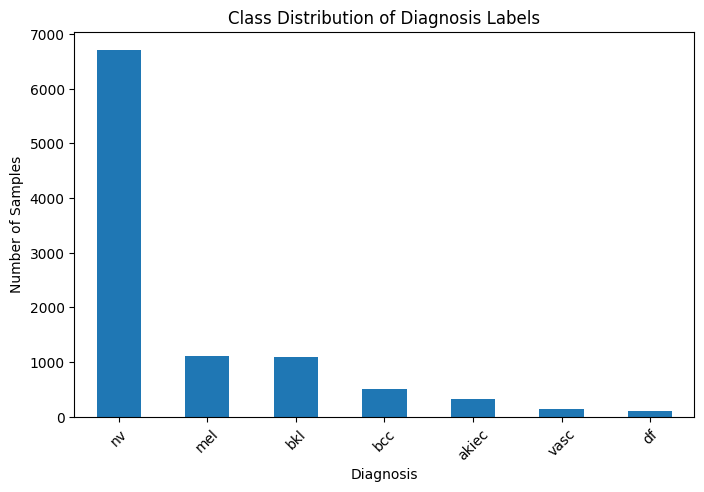

In [ ]:
plt.figure(figsize=(8,5))
df['dx'].value_counts().plot(kind='bar')
plt.title('Class Distribution of Diagnosis Labels')
plt.xlabel('Diagnosis')
plt.ylabel('Number of Samples')
plt.xticks(rotation=45)
plt.show()

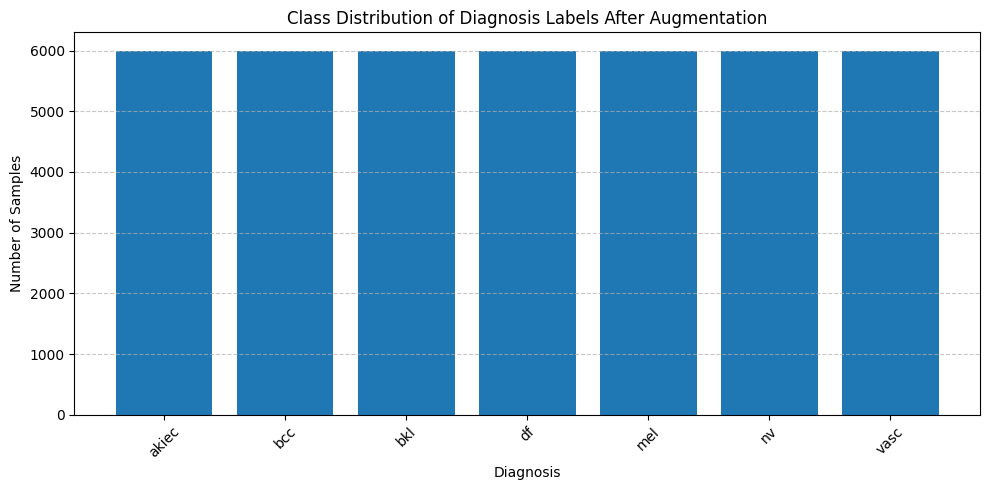

In [ ]:
folder_path = train_dir


class_counts = {}
for class_name in sorted(os.listdir(folder_path)):
    class_path = os.path.join(folder_path, class_name)
    if os.path.isdir(class_path):
        num_images = len(os.listdir(class_path))
        class_counts[class_name] = num_images


plt.figure(figsize=(10, 5))
plt.bar(class_counts.keys(), class_counts.values())
plt.title('Class Distribution of Diagnosis Labels After Augmentation')
plt.xlabel("Diagnosis")
plt.ylabel("Number of Samples")
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

In [ ]:
def get_accuracy(model, data_loader, device):
    model.eval()
    correct = 0
    total = 0

    with torch.no_grad():
        for imgs, labels in data_loader:
            imgs, labels = imgs.to(device), labels.to(device)

            outputs = model(imgs)
            preds = outputs.argmax(dim=1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

    return correct / total

In [ ]:
def train(model, train_loader, val_loader, device, batch_size=64,
          num_epochs=25, patience=3):
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

    iters, losses, train_accs, val_accs = [], [], [], []
    n = 0

    best_val_acc = 0
    patience_counter = 0
    best_model_state = None

    model.to(device)

    for epoch in range(num_epochs):
        model.train()
        epoch_loss = 0
        epoch_acc = 0
        total_samples = 0

        for imgs, labels in train_loader:
            imgs, labels = imgs.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(imgs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            preds = outputs.argmax(dim=1)
            acc = (preds == labels).float().sum().item()
            batch_size_actual = labels.size(0)

            epoch_loss += loss.item() * batch_size_actual
            epoch_acc += acc
            total_samples += batch_size_actual

            iters.append(n)
            losses.append(loss.item())
            n += 1

        avg_loss = epoch_loss / total_samples
        avg_train_acc = epoch_acc / total_samples
        avg_val_acc = get_accuracy(model, val_loader, device)

        train_accs.append(avg_train_acc)
        val_accs.append(avg_val_acc)

        print(
f"Epoch {epoch+1}/{num_epochs} | Loss: {avg_loss:.4f} | Train Acc: {avg_train_acc:.4f} | Val Acc: {avg_val_acc:.4f}")

        if avg_val_acc > best_val_acc:
            best_val_acc = avg_val_acc
            best_model_state = model.state_dict()
            patience_counter = 0
        else:
            patience_counter += 1
            if patience_counter >= patience:
                print(f"Early stopping triggered after {epoch+1} epochs.")
                break

    if best_model_state:
        model.load_state_dict(best_model_state)

    plt.figure()
    plt.plot(iters, losses)
    plt.title("Training Loss")
    plt.xlabel("Iterations")
    plt.ylabel("Loss")
    plt.show()

    plt.figure()
    plt.plot(range(len(train_accs)), train_accs, label="Train Accuracy")
    plt.plot(range(len(val_accs)), val_accs, label="Validation Accuracy")
    plt.title("Accuracy per Epoch")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.legend()
    plt.show()

    print(f"Final Training Accuracy: {train_accs[-1]:.4f}")
    print(f"Best Validation Accuracy: {best_val_acc:.4f}")

In [ ]:
import torch.nn as nn
import torch.nn.functional as F

class baseCNN(nn.Module):
    def __init__(self, num_classes=7):
        super(baseCNN, self).__init__()

        self.conv1 = nn.Conv2d(3, 32, kernel_size=3, padding=1)
        self.bn1 = nn.BatchNorm2d(32)
        self.pool1 = nn.MaxPool2d(2, 2)

        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.bn2 = nn.BatchNorm2d(64)
        self.pool2 = nn.MaxPool2d(2, 2)

        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.bn3 = nn.BatchNorm2d(128)
        self.pool3 = nn.MaxPool2d(2, 2)

        self.fc1 = nn.Linear(128 * 28 * 28, 256)
        self.fc2 = nn.Linear(256, num_classes)

    def forward(self, x):
        x = self.pool1(F.relu(self.bn1(self.conv1(x))))
        x = self.pool2(F.relu(self.bn2(self.conv2(x))))
        x = self.pool3(F.relu(self.bn3(self.conv3(x))))

        x = x.view(x.size(0), -1)
        x = F.relu(self.fc1(x))
        x = self.fc2(x)
        return x

In [ ]:
import torch.nn as nn
import torch.nn.functional as F

class EncoderDecoderCNN(nn.Module):
    def __init__(self, num_classes=7):
        super(EncoderDecoderCNN, self).__init__()

        self.encoder = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(2, 2),

            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(2, 2),

            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d(2, 2)
        )

        self.decoder = nn.Sequential(
            nn.Flatten(),
            nn.Linear(128 * 28 * 28, 256),
            nn.ReLU(),
            nn.Linear(256, num_classes)
        )

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x

here
Epoch 1/25 | Loss: 21.7722 | Train Acc: 0.1660 | Val Acc: 0.0900
Epoch 2/25 | Loss: 3.4134 | Train Acc: 0.2040 | Val Acc: 0.7050
Epoch 3/25 | Loss: 2.0037 | Train Acc: 0.2850 | Val Acc: 0.7050
Epoch 4/25 | Loss: 1.7017 | Train Acc: 0.3510 | Val Acc: 0.6850
Epoch 5/25 | Loss: 1.5321 | Train Acc: 0.4350 | Val Acc: 0.6050
Early stopping triggered after 5 epochs.


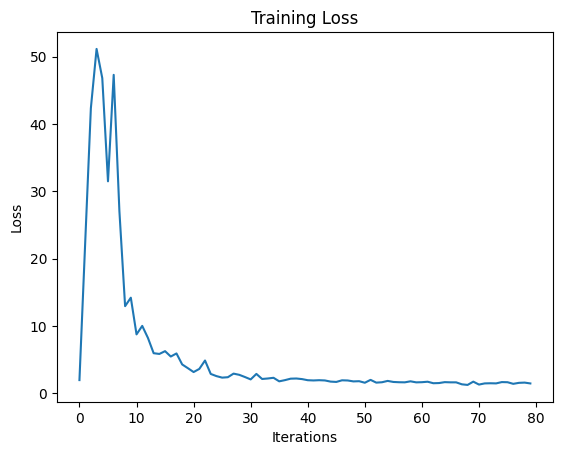

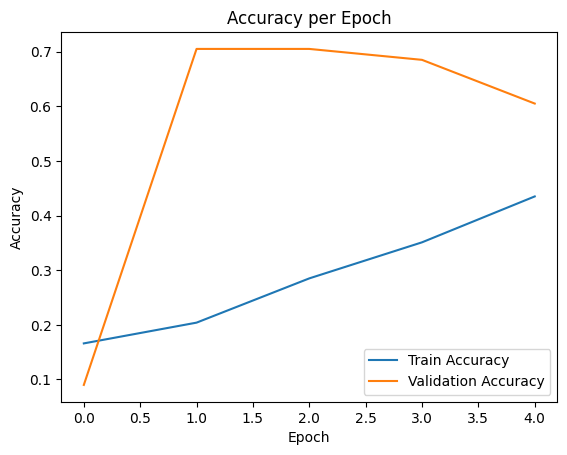

Final Training Accuracy: 0.4350
Best Validation Accuracy: 0.7050


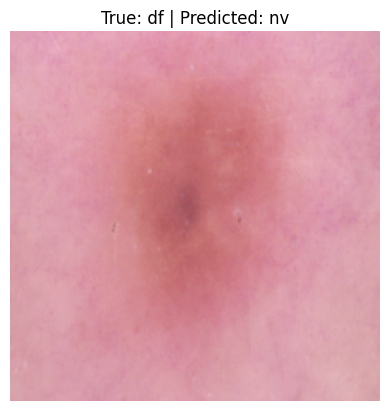

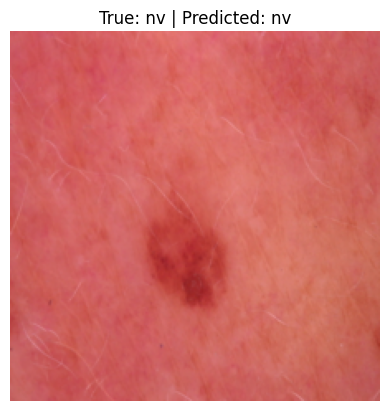

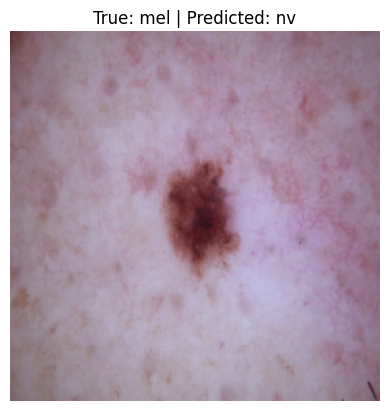

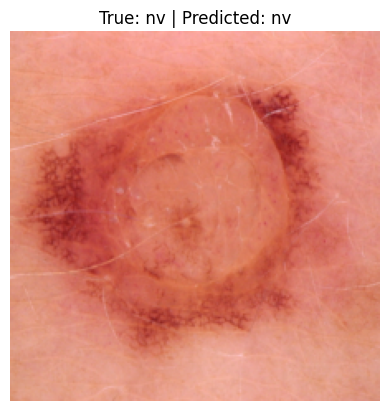

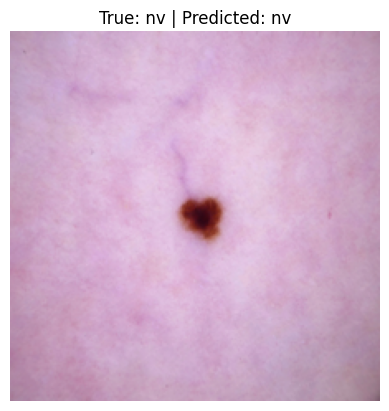

...

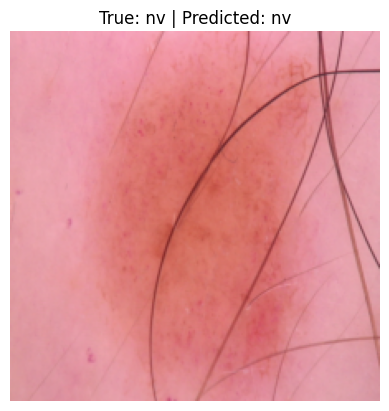

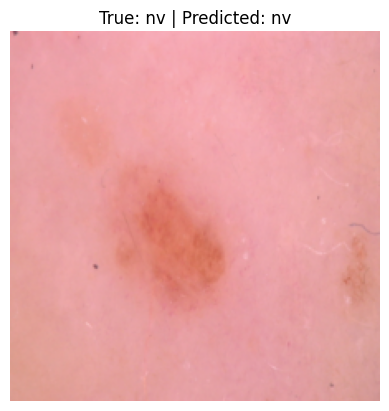

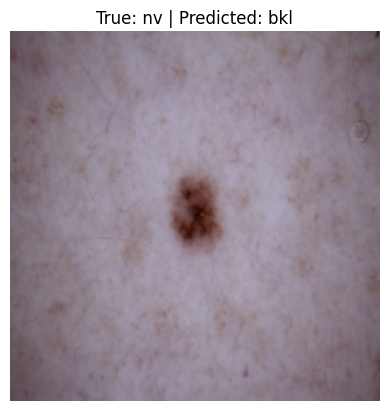

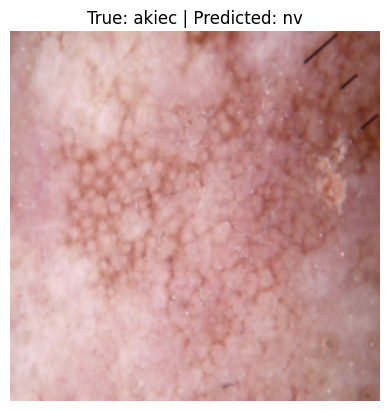

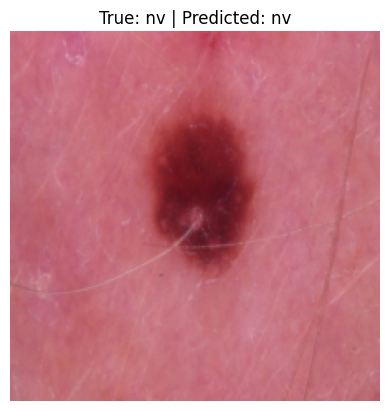

In [ ]:
from torch.utils.data import Subset
import random

random.seed(42)
torch.manual_seed(42)

train_dataset = torchvision.datasets.ImageFolder(train_dir,
                                                 transform=train_transform)
val_dataset = torchvision.datasets.ImageFolder(val_dir,
                                               transform=val_test_transform)

train_indices = random.sample(range(len(train_dataset)),1000)
val_indices = random.sample(range(len(val_dataset)), 200)

train_subset = Subset(train_dataset, train_indices)
val_subset = Subset(val_dataset, val_indices)

train_loader_small = torch.utils.data.DataLoader(train_subset, batch_size=64,
                                                 shuffle=True)
val_loader_small = torch.utils.data.DataLoader(val_subset, batch_size=64,
                                               shuffle=False)

model = EncoderDecoderCNN(num_classes=7).to(DEVICE)
print("here")
train(model, train_loader_small, val_loader_small, DEVICE, batch_size=64,
      num_epochs=25)

class_names = val_dataset.classes
import matplotlib.pyplot as plt

def show_predictions(model, data_loader, device, class_names, num_samples=5):
    model.eval()
    shown = 0

    with torch.no_grad():
        for imgs, labels in data_loader:
            imgs, labels = imgs.to(device), labels.to(device)
            outputs = model(imgs)
            preds = outputs.argmax(dim=1)

            for i in range(len(imgs)):
                if shown >= num_samples:
                    return
                img = imgs[i].cpu().permute(1, 2, 0)
                img = img * torch.tensor([0.229, 0.224, 0.225]) + torch.tensor([0.485, 0.456, 0.406])
                img = torch.clamp(img, 0, 1)

                plt.imshow(img)
                plt.title(
        f"True: {class_names[labels[i]]} | Predicted: {class_names[preds[i]]}")
                plt.axis('off')
                plt.show()
                shown += 1

show_predictions(model, val_loader_small, DEVICE, class_names, num_samples=14)



here
Epoch 1/25 | Loss: 20.4622 | Train Acc: 0.2075 | Val Acc: 0.6467
Epoch 2/25 | Loss: 2.6216 | Train Acc: 0.2608 | Val Acc: 0.6700
Epoch 3/25 | Loss: 1.7361 | Train Acc: 0.3433 | Val Acc: 0.6567
Epoch 4/25 | Loss: 1.5648 | Train Acc: 0.4275 | Val Acc: 0.6500
Epoch 5/25 | Loss: 1.3708 | Train Acc: 0.4783 | Val Acc: 0.6500
Early stopping triggered after 5 epochs.


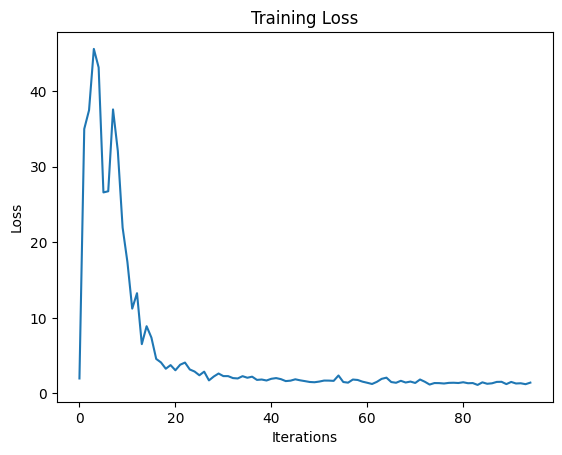

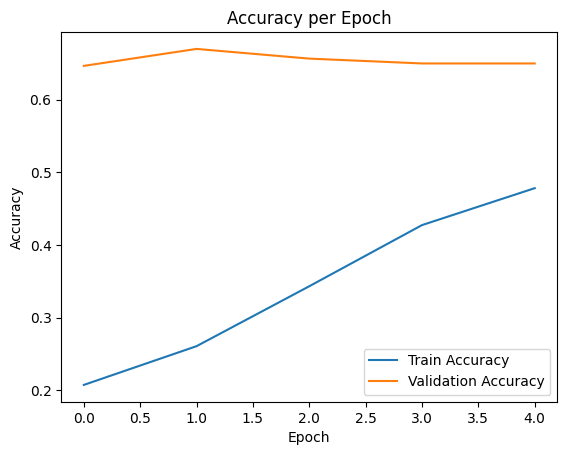

Final Training Accuracy: 0.4783
Best Validation Accuracy: 0.6700


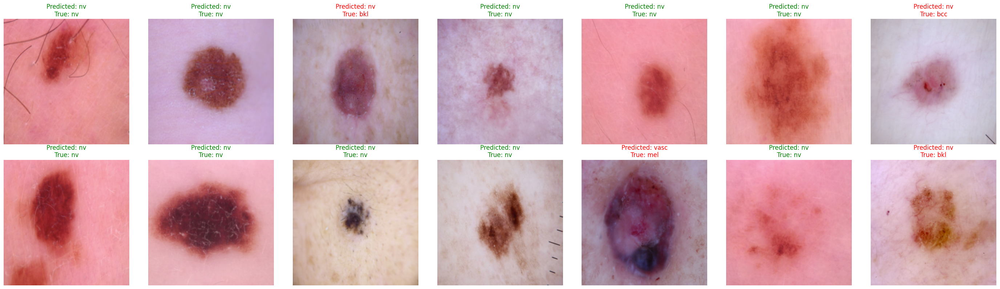

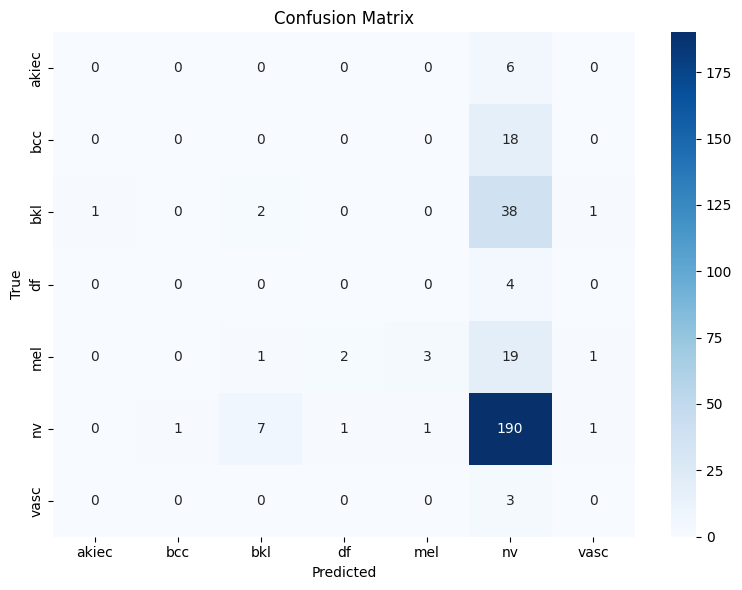

Accuracy: 0.65
Precision (weighted): 0.5509
Recall (weighted): 0.65
F1 Score (weighted): 0.5596

Classification Report:

              precision    recall  f1-score   support

       akiec       0.00      0.00      0.00         6
         bcc       0.00      0.00      0.00        18
         bkl       0.20      0.05      0.08        42
          df       0.00      0.00      0.00         4
         mel       0.75      0.12      0.20        26
          nv       0.68      0.95      0.79       201
        vasc       0.00      0.00      0.00         3

    accuracy                           0.65       300
   macro avg       0.23      0.16      0.15       300
weighted avg       0.55      0.65      0.56       300



In [ ]:
from torch.utils.data import Subset
import random

random.seed(42)
torch.manual_seed(42)

train_dataset = torchvision.datasets.ImageFolder(train_dir,
                                                 transform=train_transform)
val_dataset = torchvision.datasets.ImageFolder(val_dir,
                                               transform=val_test_transform)

train_indices = random.sample(range(len(train_dataset)),1200)
val_indices = random.sample(range(len(val_dataset)), 300)

train_subset = Subset(train_dataset, train_indices)
val_subset = Subset(val_dataset, val_indices)

train_loader_small = torch.utils.data.DataLoader(train_subset, batch_size=64,
                                                 shuffle=True)
val_loader_small = torch.utils.data.DataLoader(val_subset, batch_size=64,
                                               shuffle=False)

model = EncoderDecoderCNN(num_classes=7).to(DEVICE)
print("here")
train(model, train_loader_small, val_loader_small, DEVICE, batch_size=64,
      num_epochs=25)
class_names = val_dataset.classes
import matplotlib.pyplot as plt

import matplotlib.pyplot as plt
import torch
import torchvision

def show_predictions(model, dataloader, device, class_names, num_samples=6):
    model.eval()
    model.to(device)

    images_shown = 0
    fig_cols = 7
    fig_rows = (num_samples + fig_cols - 1) // fig_cols

    plt.figure(figsize=(fig_cols * 4, fig_rows * 4))

    with torch.no_grad():
        for imgs, labels in dataloader:
            imgs = imgs.to(device)
            labels = labels.to(device)
            outputs = model(imgs)
            preds = outputs.argmax(dim=1)

            for i in range(imgs.size(0)):
                if images_shown >= num_samples:
                    break

                img = imgs[i].cpu()
                label = labels[i].item()
                pred = preds[i].item()

                plt.subplot(fig_rows, fig_cols, images_shown + 1)
                img = img * torch.tensor([0.229, 0.224, 0.225]).view(3,1,1) + torch.tensor([0.485, 0.456, 0.406]).view(3,1,1)
                img = torch.clamp(img, 0, 1)

                plt.imshow(img.permute(1, 2, 0).numpy())
                plt.axis('off')

                color = 'green' if pred == label else 'red'
                plt.title(
        f"Predicted: {class_names[pred]}\nTrue: {class_names[label]}", color=color)

                images_shown += 1
            if images_shown >= num_samples:
                break

    plt.tight_layout()
    plt.show()

class_names = ['akiec', 'bcc', 'bkl', 'df', 'mel', 'nv', 'vasc']
show_predictions(model, val_loader_small, DEVICE, class_names, num_samples=14)

import torch
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import numpy as np

def plot_confusion_matrix(model, data_loader, device, class_names):
    model.eval()
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for imgs, labels in data_loader:
            imgs = imgs.to(device)
            outputs = model(imgs)
            preds = outputs.argmax(dim=1).cpu().numpy()
            all_preds.extend(preds)
            all_labels.extend(labels.numpy())

    cm = confusion_matrix(all_labels, all_preds)

    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
                xticklabels=class_names, yticklabels=class_names)
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.title("Confusion Matrix")
    plt.tight_layout()
    plt.show()

plot_confusion_matrix(model, val_loader_small, DEVICE, class_names)

from sklearn.metrics import classification_report, accuracy_score, f1_score, precision_score, recall_score

def evaluate_metrics(model, data_loader, device, class_names):
    model.eval()
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for imgs, labels in data_loader:
            imgs = imgs.to(device)
            outputs = model(imgs)
            preds = outputs.argmax(dim=1).cpu().numpy()
            all_preds.extend(preds)
            all_labels.extend(labels.cpu().numpy())

    acc = accuracy_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds, average='weighted')
    precision = precision_score(all_labels, all_preds, average='weighted')
    recall = recall_score(all_labels, all_preds, average='weighted')

    print("Accuracy:", round(acc, 4))
    print("Precision (weighted):", round(precision, 4))
    print("Recall (weighted):", round(recall, 4))
    print("F1 Score (weighted):", round(f1, 4))

    print("\nClassification Report:\n")
    print(classification_report(all_labels, all_preds, target_names=class_names))

evaluate_metrics(model, val_loader_small, DEVICE, class_names)

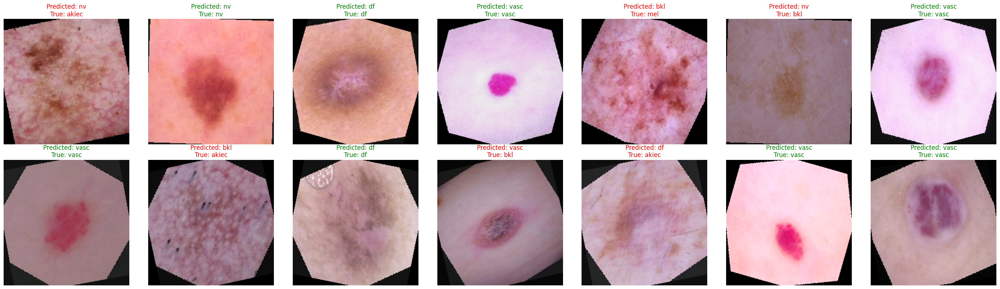

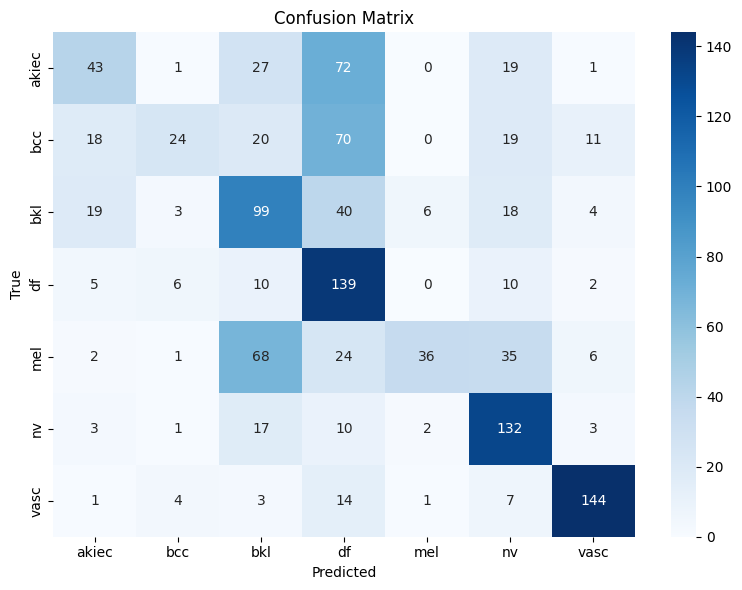

Accuracy: 0.5225
Precision (weighted): 0.5777
Recall (weighted): 0.5225
F1 Score (weighted): 0.4873

Classification Report:

              precision    recall  f1-score   support

       akiec       0.48      0.24      0.32       163
         bcc       0.59      0.12      0.20       162
         bkl       0.44      0.56      0.49       189
          df       0.40      0.83      0.54       172
         mel       0.78      0.25      0.38       172
          nv       0.51      0.79      0.62       168
        vasc       0.85      0.83      0.84       174

    accuracy                           0.52      1200
   macro avg       0.58      0.52      0.48      1200
weighted avg       0.58      0.52      0.49      1200



In [ ]:
show_predictions(model, train_loader_small, DEVICE, class_names, num_samples=14)
plot_confusion_matrix(model, train_loader_small, DEVICE, class_names)
evaluate_metrics(model, train_loader_small, DEVICE, class_names)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Using device: cuda
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 161MB/s]


Epoch 1/25 | Loss: 1.0826 | Train Acc: 0.6006 | Val Acc: 0.7280
Epoch 2/25 | Loss: 0.6665 | Train Acc: 0.7622 | Val Acc: 0.7780
Epoch 3/25 | Loss: 0.5285 | Train Acc: 0.8140 | Val Acc: 0.7420
Epoch 4/25 | Loss: 0.4234 | Train Acc: 0.8512 | Val Acc: 0.7630
Epoch 5/25 | Loss: 0.3638 | Train Acc: 0.8772 | Val Acc: 0.8060
Epoch 6/25 | Loss: 0.2989 | Train Acc: 0.8972 | Val Acc: 0.8040
Epoch 7/25 | Loss: 0.2497 | Train Acc: 0.9188 | Val Acc: 0.7810
Epoch 8/25 | Loss: 0.2076 | Train Acc: 0.9322 | Val Acc: 0.8110
Epoch 9/25 | Loss: 0.1601 | Train Acc: 0.9528 | Val Acc: 0.8010
Epoch 10/25 | Loss: 0.1326 | Train Acc: 0.9612 | Val Acc: 0.8040
Epoch 11/25 | Loss: 0.1102 | Train Acc: 0.9698 | Val Acc: 0.7860
Early stopping triggered after 11 epochs.

Final Training Accuracy: 0.9698
Best Validation Accuracy: 0.811


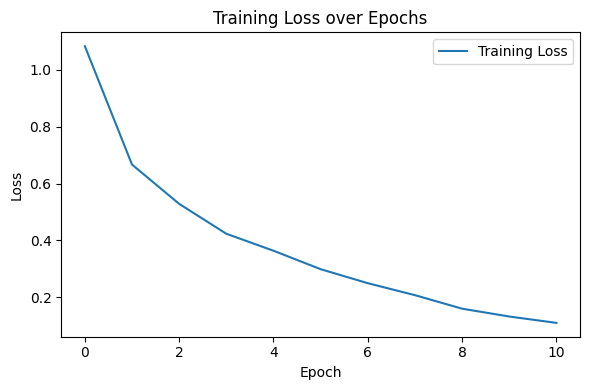

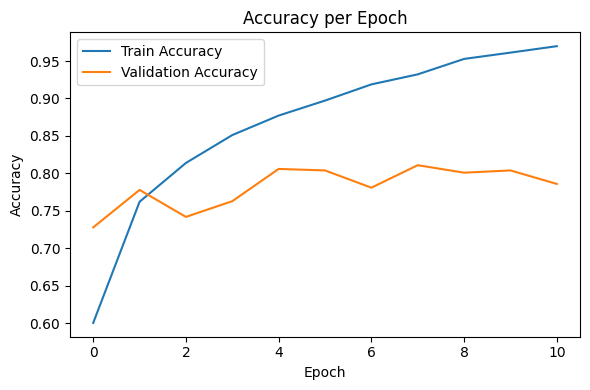

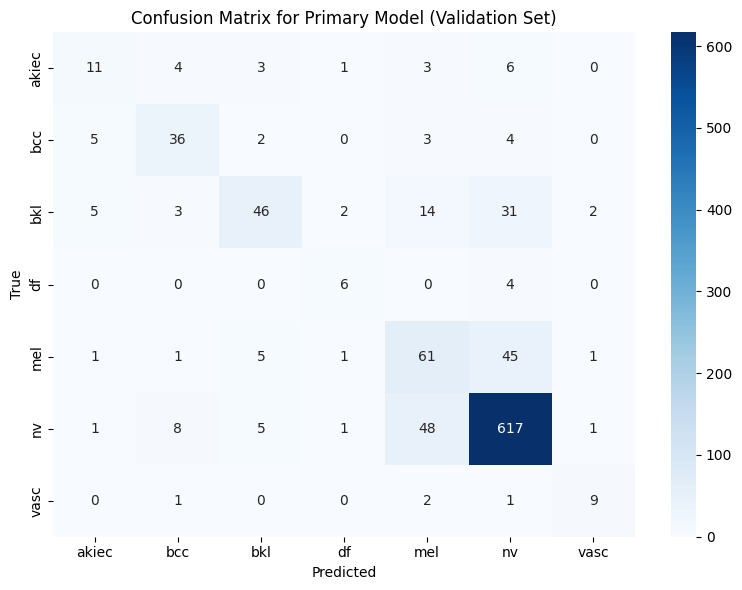


Classification Report:

              precision    recall  f1-score   support

       akiec       0.48      0.39      0.43        28
         bcc       0.68      0.72      0.70        50
         bkl       0.75      0.45      0.56       103
          df       0.55      0.60      0.57        10
         mel       0.47      0.53      0.50       115
          nv       0.87      0.91      0.89       681
        vasc       0.69      0.69      0.69        13

    accuracy                           0.79      1000
   macro avg       0.64      0.61      0.62      1000
weighted avg       0.79      0.79      0.78      1000



In [ ]:
from google.colab import drive
import torch, torchvision, os, random
import torch.nn as nn
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, Subset
import torchvision.models as models
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report

drive.mount('/content/drive')

train_dir = "/content/drive/MyDrive/APS360 Project/Data/train"
val_dir = "/content/drive/MyDrive/APS360 Project/Data/val"

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", DEVICE)

train_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(15),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

val_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

train_dataset = torchvision.datasets.ImageFolder(train_dir, transform=train_transform)
val_dataset = torchvision.datasets.ImageFolder(val_dir, transform=val_transform)

random.seed(42)
train_subset = Subset(train_dataset, random.sample(range(len(train_dataset)), 5000))
val_subset = Subset(val_dataset, random.sample(range(len(val_dataset)), 1000))

train_loader = DataLoader(train_subset, batch_size=64, shuffle=True, num_workers=2)
val_loader = DataLoader(val_subset, batch_size=64, shuffle=False, num_workers=2)

class_names = train_dataset.classes

resnet18 = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)
for name, param in resnet18.named_parameters():
    if "layer4" in name or "fc" in name:
        param.requires_grad = True
    else:
        param.requires_grad = False

num_features = resnet18.fc.in_features
resnet18.fc = nn.Linear(num_features, len(class_names))
resnet18 = resnet18.to(DEVICE)

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(filter(lambda p: p.requires_grad, resnet18.parameters()), lr=1e-4, weight_decay=1e-4)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=8, gamma=0.5)

def train_model(model, train_loader, val_loader, num_epochs=25, patience=3):
    best_val_acc = 0
    early_stop_counter = 0
    train_losses, train_accs, val_accs = [], [], []
    for epoch in range(num_epochs):
        model.train()
        running_loss, correct_train, total_train = 0.0, 0, 0
        for imgs, labels in train_loader:
            imgs, labels = imgs.to(DEVICE), labels.to(DEVICE)
            optimizer.zero_grad()
            outputs = model(imgs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            running_loss += loss.item()
            _, preds = torch.max(outputs, 1)
            total_train += labels.size(0)
            correct_train += (preds == labels).sum().item()
        scheduler.step()
        train_loss = running_loss / len(train_loader)
        train_acc = correct_train / total_train
        train_losses.append(train_loss)
        train_accs.append(train_acc)
        model.eval()
        correct_val, total_val = 0, 0
        with torch.no_grad():
            for imgs, labels in val_loader:
                imgs, labels = imgs.to(DEVICE), labels.to(DEVICE)
                outputs = model(imgs)
                _, preds = torch.max(outputs, 1)
                total_val += labels.size(0)
                correct_val += (preds == labels).sum().item()
        val_acc = correct_val / total_val
        val_accs.append(val_acc)
        print(f"Epoch {epoch+1}/{num_epochs} | Loss: {train_loss:.4f} | Train Acc: {train_acc:.4f} | Val Acc: {val_acc:.4f}")
        if val_acc > best_val_acc:
            best_val_acc = val_acc
            early_stop_counter = 0
        else:
            early_stop_counter += 1
            if early_stop_counter >= patience:
                print(f"Early stopping triggered after {epoch+1} epochs.")
                break
    print("\nFinal Training Accuracy:", round(train_accs[-1], 4))
    print("Best Validation Accuracy:", round(max(val_accs), 4))
    return train_losses, train_accs, val_accs

train_loss, train_acc, val_acc = train_model(resnet18, train_loader, val_loader, num_epochs=25)

plt.figure(figsize=(6,4))
plt.plot(train_loss, label="Training Loss")
plt.title("Training Loss over Epochs")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.tight_layout()
plt.show()

plt.figure(figsize=(6,4))
plt.plot(train_acc, label="Train Accuracy")
plt.plot(val_acc, label="Validation Accuracy")
plt.title("Accuracy per Epoch")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()
plt.tight_layout()
plt.show()

all_preds, all_labels = [], []
resnet18.eval()
with torch.no_grad():
    for imgs, labels in val_loader:
        imgs, labels = imgs.to(DEVICE), labels.to(DEVICE)
        outputs = resnet18(imgs)
        _, preds = torch.max(outputs, 1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

cm = confusion_matrix(all_labels, all_preds)
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=class_names, yticklabels=class_names)
plt.title("Confusion Matrix for Primary Model (Validation Set)")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.tight_layout()
plt.show()

print("\nClassification Report:\n")
print(classification_report(all_labels, all_preds, target_names=class_names))

In [ ]:
random.seed(42)
test_indices = random.sample(range(len(val_dataset)), 1000)
test_subset = Subset(val_dataset, test_indices)
test_loader = DataLoader(test_subset, batch_size=64, shuffle=False, num_workers=2)

In [ ]:
resnet18.eval()
correct_test, total_test = 0, 0

with torch.no_grad():
    for imgs, labels in test_loader:
        imgs, labels = imgs.to(DEVICE), labels.to(DEVICE)
        outputs = resnet18(imgs)
        _, preds = torch.max(outputs, 1)
        total_test += labels.size(0)
        correct_test += (preds == labels).sum().item()

test_acc = correct_test / total_test
print(f"Final Test Accuracy: {test_acc:.4f}")

Final Test Accuracy: 0.7720


In [ ]:
!unzip "/content/drive/MyDrive/APS360 Project/Data/bcn20000.zip" \
      -d "/content/drive/MyDrive/APS360 Project/Data/BCN20000_raw"

Streaming output truncated to the last 5000 lines.
  inflating: /content/drive/MyDrive/APS360 Project/Data/BCN20000_raw/ISIC_0068031.jpg  
  inflating: /content/drive/MyDrive/APS360 Project/Data/BCN20000_raw/ISIC_0068032.jpg  
  inflating: /content/drive/MyDrive/APS360 Project/Data/BCN20000_raw/ISIC_0068033.jpg  
  inflating: /content/drive/MyDrive/APS360 Project/Data/BCN20000_raw/ISIC_0068034.jpg  
  inflating: /content/drive/MyDrive/APS360 Project/Data/BCN20000_raw/ISIC_0068035.jpg  
  inflating: /content/drive/MyDrive/APS360 Project/Data/BCN20000_raw/ISIC_0068036.jpg  
  inflating: /content/drive/MyDrive/APS360 Project/Data/BCN20000_raw/ISIC_0068037.jpg  
  inflating: /content/drive/MyDrive/APS360 Project/Data/BCN20000_raw/ISIC_0068038.jpg  
  inflating: /content/drive/MyDrive/APS360 Project/Data/BCN20000_raw/ISIC_0068039.jpg  
  inflating: /content/drive/MyDrive/APS360 Project/Data/BCN20000_raw/ISIC_0068040.jpg  
  inflating: /content/drive/MyDrive/APS360 Project/Data/BCN20000_raw/

In [ ]:
import pandas as pd

csv_path = "/content/drive/MyDrive/APS360 Project/Data/bcn20000_metadata.csv"
df = pd.read_csv(csv_path)

print(df.shape)
print(df.columns)
df.head()

(18946, 15)
Index(['isic_id', 'attribution', 'copyright_license', 'age_approx',
       'anatom_site_general', 'anatom_site_special', 'concomitant_biopsy',
       'diagnosis_1', 'diagnosis_2', 'diagnosis_3', 'diagnosis_confirm_type',
       'image_type', 'lesion_id', 'melanocytic', 'sex'],
      dtype='object')


,isic_id,attribution,copyright_license,age_approx,anatom_site_general,anatom_site_special,concomitant_biopsy,diagnosis_1,diagnosis_2,diagnosis_3,diagnosis_confirm_type,image_type,lesion_id,melanocytic,sex
0,ISIC_0053453,Hospital Clínic de Barcelona,CC-BY-NC,60.0,anterior torso,NaN,True,Benign,Benign melanocytic proliferations,Nevus,histopathology,dermoscopic,IL_0433332,True,male
1,ISIC_0053454,Hospital Clínic de Barcelona,CC-BY-NC,55.0,anterior torso,NaN,True,Malignant,Malignant melanocytic proliferations (Melanoma),"Melanoma, NOS",histopathology,dermoscopic,IL_8314504,True,male
2,ISIC_0053455,Hospital Clínic de Barcelona,CC-BY-NC,50.0,lower extremity,NaN,True,NaN,NaN,NaN,histopathology,dermoscopic,IL_8065011,NaN,male
3,ISIC_0053456,Hospital Clínic de Barcelona,CC-BY-NC,50.0,anterior torso,NaN,True,Malignant,Malignant melanocytic proliferations (Melanoma),"Melanoma, NOS",histopathology,dermoscopic,IL_5496448,True,female
4,ISIC_0053457,Hospital Clínic de Barcelona,CC-BY-NC,85.0,head/neck,NaN,True,Malignant,Malignant epidermal proliferations,"Squamous cell carcinoma, NOS",histopathology,dermoscopic,IL_7128083,False,male


In [ ]:
import os, shutil
import pandas as pd

DATA_ROOT = "/content/drive/MyDrive/APS360 Project/Data"
RAW_DIR   = os.path.join(DATA_ROOT, "BCN20000_raw")
CSV_PATH  = os.path.join(DATA_ROOT, "bcn20000_metadata.csv")
OUT_ROOT  = os.path.join(DATA_ROOT, "BCN20000_ImageFolder")

if os.path.exists(OUT_ROOT):
    shutil.rmtree(OUT_ROOT)
os.makedirs(OUT_ROOT, exist_ok=True)

df = pd.read_csv(CSV_PATH)

id_col = "isic_id"
dx_col = "diagnosis_3"

print("Rows:", len(df))
print("Columns:", df.columns)

CLASS_NAMES = ["akiec", "bcc", "bkl", "df", "mel", "nv", "vasc"]
for c in CLASS_NAMES:
    os.makedirs(os.path.join(OUT_ROOT, c), exist_ok=True)

def map_to_ham7(dx3):
    """Map BCN20000 diagnosis_3 string → one of 7 HAM10000 classes, or None to skip."""
    dx3 = str(dx3).lower()
    if "nevus" in dx3:
        return "nv"
    if "melanoma" in dx3:
        return "mel"
    if "basal cell carcinoma" in dx3:
        return "bcc"
    if "dermatofibroma" in dx3:
        return "df"
    if "vascular" in dx3 or "hemangioma" in dx3:
        return "vasc"
    if "seborrheic keratosis" in dx3 or "solar lentigo" in dx3 or "lentigo" in dx3:
        return "bkl"
    if "actinic keratosis" in dx3 or "intraepithelial carcinoma" in dx3:
        return "akiec"
    if "squamous cell carcinoma" in dx3 or "scc" in dx3:
        return None
    return None

label_counts = {c: 0 for c in CLASS_NAMES}
skipped_dx, skipped_img = 0, 0

for _, row in df.iterrows():
    img_id = row[id_col]
    dx3    = row[dx_col]

    label = map_to_ham7(dx3)
    if label is None:
        skipped_dx += 1
        continue

    jpg = os.path.join(RAW_DIR, f"{img_id}.jpg")
    png = os.path.join(RAW_DIR, f"{img_id}.png")
    if os.path.exists(jpg):
        src = jpg
    elif os.path.exists(png):
        src = png
    else:
        skipped_img += 1
        continue

    dst = os.path.join(OUT_ROOT, label, os.path.basename(src))
    shutil.copy(src, dst)
    label_counts[label] += 1

print("\nImages per class:")
for c in CLASS_NAMES:
    print(f"{c}: {label_counts[c]}")

print("Skipped (no HAM7 label / SCC / other):", skipped_dx)
print("Skipped (missing image file):", skipped_img)
print("Output root:", OUT_ROOT)

Rows: 18946
Columns: Index(['isic_id', 'attribution', 'copyright_license', 'age_approx',
       'anatom_site_general', 'anatom_site_special', 'concomitant_biopsy',
       'diagnosis_1', 'diagnosis_2', 'diagnosis_3', 'diagnosis_confirm_type',
       'image_type', 'lesion_id', 'melanocytic', 'sex'],
      dtype='object')

Images per class:
akiec: 1088
bcc: 3676
bkl: 1551
df: 168
mel: 4636
nv: 5647
vasc: 0
Skipped (no HAM7 label / SCC / other): 2180
Skipped (missing image file): 0
Output root: /content/drive/MyDrive/APS360 Project/Data/BCN20000_ImageFolder


In [ ]:
import shutil
import os

vasc_dir = "/content/drive/MyDrive/APS360 Project/Data/BCN20000_ImageFolder/vasc"

if os.path.exists(vasc_dir):
    shutil.rmtree(vasc_dir)
    print("Removed empty folder: vasc")

Removed empty folder: vasc


In [ ]:
from torchvision import datasets
from torch.utils.data import DataLoader

bcn_dir = "/content/drive/MyDrive/APS360 Project/Data/BCN20000_ImageFolder"

bcn_dataset = datasets.ImageFolder(root=bcn_dir, transform=val_transform)
bcn_loader  = DataLoader(bcn_dataset, batch_size=32, shuffle=False)

print("Classes:", bcn_dataset.classes)
print("Total images:", len(bcn_dataset))

Classes: ['akiec', 'bcc', 'bkl', 'df', 'mel', 'nv']
Total images: 16766


In [ ]:
from torchvision import datasets
from torch.utils.data import DataLoader, Subset
import random

bcn_dir = "/content/drive/MyDrive/APS360 Project/Data/BCN20000_ImageFolder"

bcn_dataset = datasets.ImageFolder(root=bcn_dir, transform=val_transform)

print("Full BCN size:", len(bcn_dataset))
print("Classes:", bcn_dataset.classes)

Full BCN size: 16766
Classes: ['akiec', 'bcc', 'bkl', 'df', 'mel', 'nv']


In [ ]:
from torch.utils.data import DataLoader, Subset
import random

bcn_dir = "/content/drive/MyDrive/APS360 Project/Data/BCN20000_ImageFolder"
bcn_dataset = datasets.ImageFolder(root=bcn_dir, transform=val_transform)

print("Full BCN size:", len(bcn_dataset))
print("Classes:", bcn_dataset.classes)

random.seed(42)
subset_size = 1000
subset_indices = random.sample(range(len(bcn_dataset)), subset_size)

bcn_subset = Subset(bcn_dataset, subset_indices)
bcn_subset_loader = DataLoader(bcn_subset, batch_size=32, shuffle=False)

print("Subset size:", len(bcn_subset))

Full BCN size: 16766
Classes: ['akiec', 'bcc', 'bkl', 'df', 'mel', 'nv']
Subset size: 1000


In [ ]:
model.eval()
correct = 0
total = 0

with torch.no_grad():
    for images, labels in bcn_subset_loader:
        images = images.to(DEVICE)
        labels = labels.to(DEVICE)

        outputs = model(images)
        _, preds = outputs.max(1)

        correct += (preds == labels).sum().item()
        total += labels.size(0)

acc = correct / total
print(f"BCN20000 accuracy: {acc * 100:.2f}%")

BCN20000 accuracy: 73.60%



GRAD-CAM VISUALIZATION

Image 1/5
True Label: nv


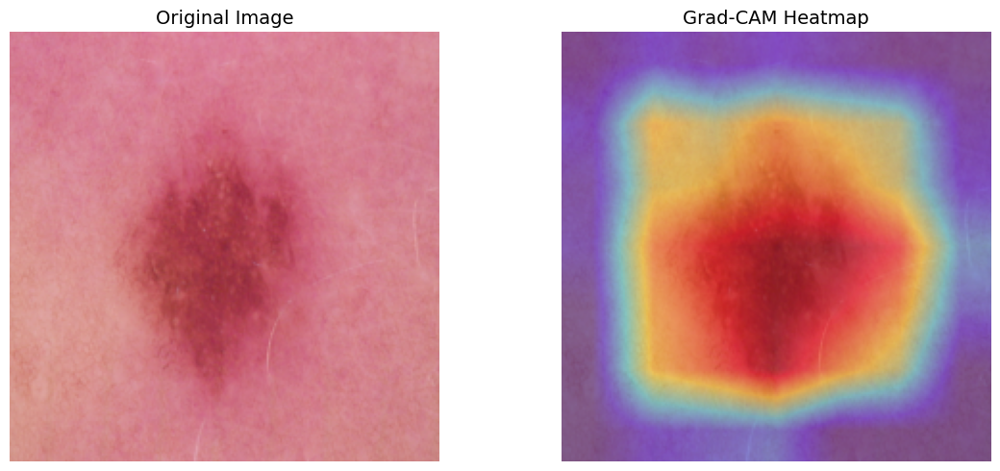

Predicted Label: nv
--------------------------------------------------

Image 2/5
True Label: mel


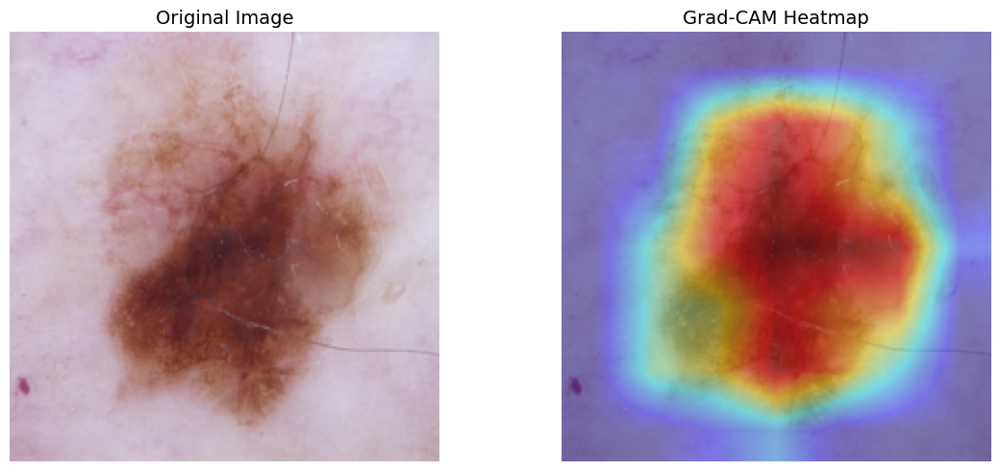

Predicted Label: nv
--------------------------------------------------

Image 3/5
True Label: nv


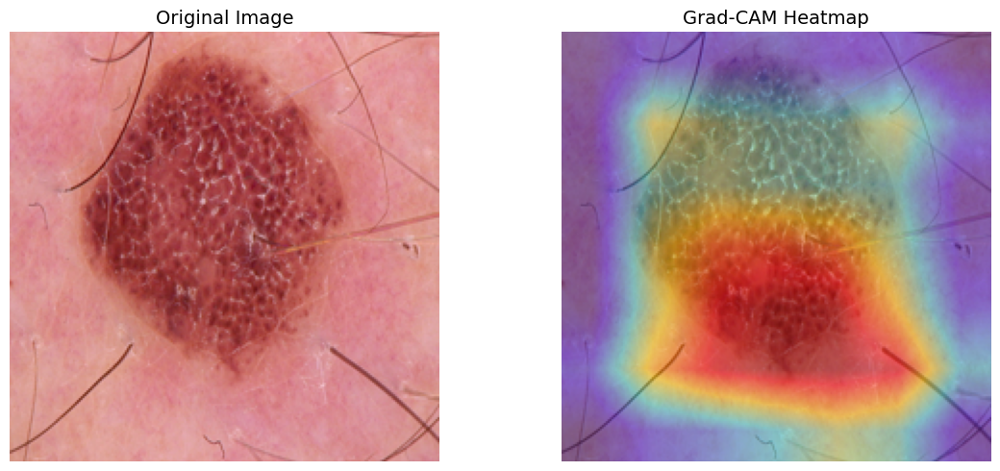

Predicted Label: nv
--------------------------------------------------

Image 4/5
True Label: bkl


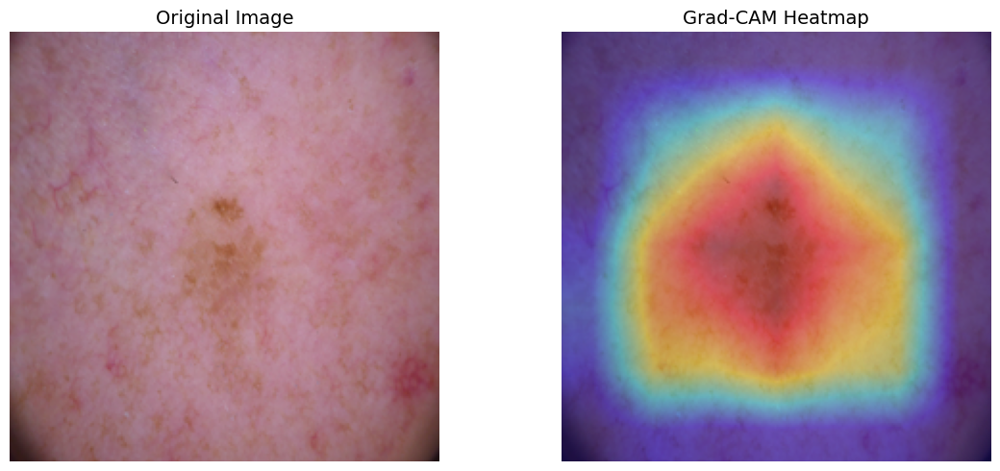

Predicted Label: bkl
--------------------------------------------------

Image 5/5
True Label: bcc


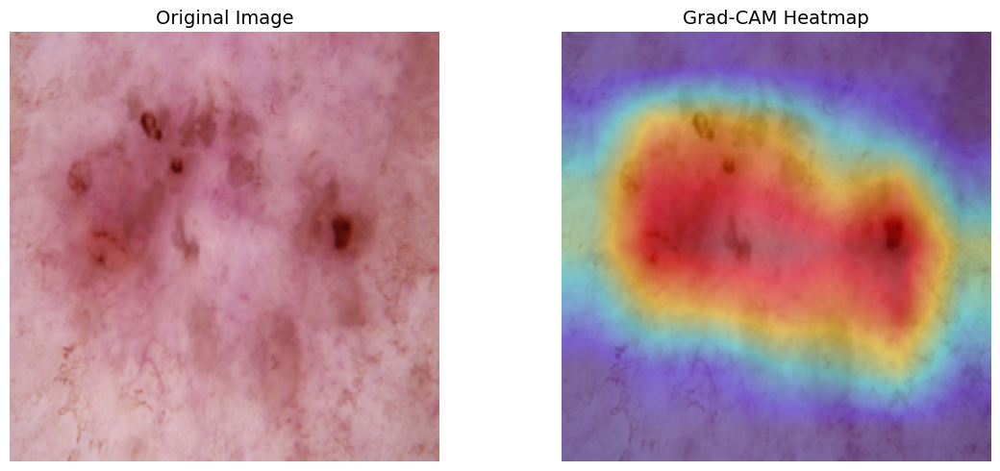

Predicted Label: bcc
--------------------------------------------------

Single Image Example:
True Label: nv


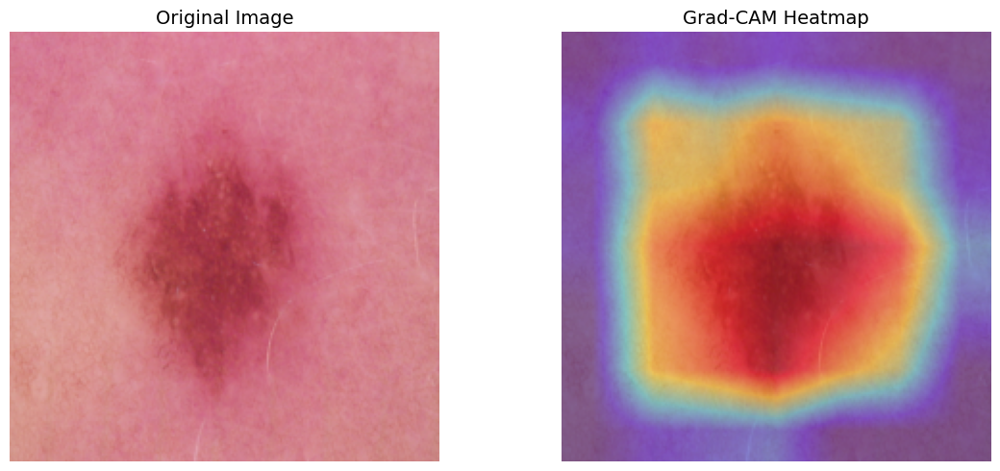

Predicted Label: nv


In [ ]:
import torch
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import cv2

class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None
        self.hooks = []
        self.hooks.append(self.target_layer.register_forward_hook(self.save_activation))
        self.hooks.append(self.target_layer.register_full_backward_hook(self.save_gradient))

    def save_activation(self, module, input, output):
        self.activations = output.detach()

    def save_gradient(self, module, grad_input, grad_output):
        self.gradients = grad_output[0].detach()

    def remove_hooks(self):
        for hook in self.hooks:
            hook.remove()

    def generate_cam(self, input_image, target_class=None):
        model_output = self.model(input_image)
        if target_class is None:
            target_class = model_output.argmax(dim=1)
        self.model.zero_grad()
        class_loss = model_output[0, target_class]
        class_loss.backward()
        gradients = self.gradients[0]
        activations = self.activations[0]
        alpha = F.relu(gradients)
        alpha = alpha / (alpha.sum(dim=(1, 2), keepdim=True) + 1e-8)
        weights = (alpha * F.relu(gradients)).sum(dim=(1, 2))
        cam = torch.zeros(activations.shape[1:], device=activations.device)
        for i, w in enumerate(weights):
            cam += w * activations[i]
        cam = F.relu(cam)
        cam_flat = cam.flatten()
        cam_min = torch.quantile(cam_flat, 0.05)
        cam_max = torch.quantile(cam_flat, 0.95)
        cam = torch.clamp(cam, cam_min, cam_max)
        cam = (cam - cam_min) / (cam_max - cam_min + 1e-8)
        return cam.cpu().numpy(), target_class.item()

def visualize_gradcam(model, img_tensor, original_img, class_names, save_path=None):
    target_layer = model.layer4[-1].conv2
    gradcam = GradCAM(model, target_layer)
    model.eval()
    cam, pred_class = gradcam.generate_cam(img_tensor)
    gradcam.remove_hooks()
    cam_resized = cv2.resize(cam, (224, 224))
    img_np = np.array(original_img.resize((224, 224)))
    heatmap = cv2.applyColorMap(np.uint8(255 * cam_resized), cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
    superimposed = np.uint8(heatmap * 0.4 + img_np * 0.6)
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    axes[0].imshow(img_np)
    axes[0].set_title("Original Image", fontsize=14)
    axes[0].axis('off')
    axes[1].imshow(superimposed)
    axes[1].set_title("Grad-CAM Heatmap", fontsize=14)
    axes[1].axis('off')
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=150, bbox_inches='tight')
    plt.show()
    return pred_class

def visualize_multiple_gradcam(model, val_loader, val_subset, val_dataset, class_names, num_images=5):
    model.eval()
    dataiter = iter(val_loader)
    images, labels = next(dataiter)
    for i in range(min(num_images, len(images))):
        img_tensor = images[i:i+1].to(DEVICE)
        true_label = labels[i].item()
        original_idx = val_subset.indices[i]
        img_path = val_dataset.imgs[original_idx][0]
        original_img = Image.open(img_path).convert('RGB')
        print(f"\nImage {i+1}/{num_images}")
        print(f"True Label: {class_names[true_label]}")
        pred_class = visualize_gradcam(model, img_tensor, original_img, class_names)
        print(f"Predicted Label: {class_names[pred_class]}")
        print("-" * 50)

print("\n" + "="*70)
print("GRAD-CAM VISUALIZATION")
print("="*70)
visualize_multiple_gradcam(resnet18, val_loader, val_subset, val_dataset, class_names, num_images=5)
dataiter = iter(val_loader)
images, labels = next(dataiter)
img_tensor = images[0:1].to(DEVICE)
true_label = labels[0].item()
original_idx = val_subset.indices[0]
img_path = val_dataset.imgs[original_idx][0]
original_img = Image.open(img_path).convert('RGB')
print(f"\nSingle Image Example:")
print(f"True Label: {class_names[true_label]}")
pred_class = visualize_gradcam(resnet18, img_tensor, original_img, class_names, save_path="gradcam_result.png")
print(f"Predicted Label: {class_names[pred_class]}")